# Classification sur l'attribut surgical_lesion

### Fixer la valeur du seed 

In [1]:
seed = 7

## 0) L'étude du dataset

L'ensemble de données contient 368 instances. En effet, celles-ci sont séparées en deux ensembles, soit 300 données d'entraînement et 68 données de test. Au total, il y a 28 attributs différents qui peuvent être des valeurs continues, discrètes ou nominales. Cet ensemble de données date de l'année 1989. Il est souvent utilisé pour des tâches de classification. L'objectif est de prédire ce qui arrivera au cheval, soit son outcome. En effet l'attribut 23 correspond à cette valeur et peut soit être 1,2 ou 3. La valeur 1 est pour indiquer que le cheval survit, 2 si le cheval est décédé et 3 si celui-ci a été euthanasié. Il est aussi possible d'utiliser l'attribut 24 pour le problème de classification. Il s'agit d'un attribut booléen indiquant si le problème (lésion) du cheval était chirurgical. Une des particularités de cet ensemble de données est sa quantité de valeurs manquantes. En effet, environ 20% des valeurs sont manquantes ce qui offre un défi pour les personnes souhaitant effectuer des expériences avec.

Les attributs présents consistent plusieurs informations qui pourraient nous aider à classifier les données. Les attributs sont surgery qui représente un booléen indiquant si le cheval a déjà reçu une chirurgie, l'âge du cheval, le numéro de l'hôpital où le cheval a été traité, la température rectale, la fréquence respiratoire, plusieurs informations subjectives telles que la douleur du cheval et des attributs sur des conditions médicales des organes du cheval.

## 1) Téléchargement du dataset

In [2]:
import pandas as pd
import numpy as np 
import wget 
import os

directory = "./data"
# Créer le répertoire seulement s'il n'existe pas déjà
try:
    os.makedirs(directory)
except FileExistsError:
    # directory already exists
    pass

url_train = 'http://archive.ics.uci.edu/ml/machine-learning-databases/horse-colic/horse-colic.data'
url_test =  'http://archive.ics.uci.edu/ml/machine-learning-databases/horse-colic/horse-colic.test'

path_to_train = "./data/horse-colic.data"
path_to_test = "./data/horse-colic.test"

if not os.path.exists(path_to_train) and not os.path.exists(path_to_test) :
    wget.download(url_train, path_to_train)
    wget.download(url_test, path_to_test)
else:
    print("Les données d'entrainement et celles de test ont déjà été téléchargées")



Les données d'entrainement et celles de test ont déjà été téléchargées


## 2) Exploration des données

In [3]:
variable_names = ["surgery", "age", "hospital_number",
    "rectal_temperature", "pulse",
    "respiratory_rate", "temperature_extremities",
    "peripheral_pulse", "mucous_membranes",
    "capillary_refill_time", "pain",
    "peristalsis", "abdominal_distension",
    "nasogastric_tube", "nasogastric_reflux",
    "nasogastric_reflux_ph", "feces", "abdomen",
    "packed_cell_volume", "total_protein",
    "abdomcentesis_appearance", "abdomcentesis_total_protein",
    "outcome", "surgical_lesion", "lesion_1", "lesion_2", "lesion_3",
    "cp_data"]

# Remplacer toutes les valeurs manquantes par NaN avec le paramètre na_values
df_train = pd.read_csv(path_to_train, delim_whitespace=True, names=variable_names, na_values="?")
df_test= pd.read_csv(path_to_test, delim_whitespace=True, names=variable_names, na_values="?")


In [4]:
df_train

,surgery,age,hospital_number,rectal_temperature,pulse,respiratory_rate,temperature_extremities,peripheral_pulse,mucous_membranes,capillary_refill_time,...,packed_cell_volume,total_protein,abdomcentesis_appearance,abdomcentesis_total_protein,outcome,surgical_lesion,lesion_1,lesion_2,lesion_3,cp_data
0,2.0,1,530101,38.5,66.0,28.0,3.0,3.0,NaN,2.0,...,45.0,8.4,NaN,NaN,2.0,2,11300,0,0,2
1,1.0,1,534817,39.2,88.0,20.0,NaN,NaN,4.0,1.0,...,50.0,85.0,2.0,2.0,3.0,2,2208,0,0,2
2,2.0,1,530334,38.3,40.0,24.0,1.0,1.0,3.0,1.0,...,33.0,6.7,NaN,NaN,1.0,2,0,0,0,1
3,1.0,9,5290409,39.1,164.0,84.0,4.0,1.0,6.0,2.0,...,48.0,7.2,3.0,5.3,2.0,1,2208,0,0,1
4,2.0,1,530255,37.3,104.0,35.0,NaN,NaN,6.0,2.0,...,74.0,7.4,NaN,NaN,2.0,2,4300,0,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,1.0,1,533886,NaN,120.0,70.0,4.0,NaN,4.0,2.0,...,55.0,65.0,NaN,NaN,3.0,2,3205,0,0,2
296,2.0,1,527702,37.2,72.0,24.0,3.0,2.0,4.0,2.0,...,44.0,NaN,3.0,3.3,3.0,1,2208,0,0,1
297,1.0,1,529386,37.5,72.0,30.0,4.0,3.0,4.0,1.0,...,60.0,6.8,NaN,NaN,2.0,1,3205,0,0,2
298,1.0,1,530612,36.5,100.0,24.0,3.0,3.0,3.0,1.0,...,50.0,6.0,3.0,3.4,1.0,1,2208,0,0,1


In [5]:
df_test

,surgery,age,hospital_number,rectal_temperature,pulse,respiratory_rate,temperature_extremities,peripheral_pulse,mucous_membranes,capillary_refill_time,...,packed_cell_volume,total_protein,abdomcentesis_appearance,abdomcentesis_total_protein,outcome,surgical_lesion,lesion_1,lesion_2,lesion_3,cp_data
0,2.0,1,528626,38.5,54.0,20.0,NaN,1.0,2.0,2.0,...,42.0,6.3,NaN,NaN,1.0,2,3111,0,0,1
1,2.0,1,527950,37.6,48.0,36.0,NaN,NaN,1.0,1.0,...,44.0,6.3,1.0,5.0,1.0,2,3111,0,0,1
2,1.0,1,535263,37.7,44.0,28.0,NaN,4.0,3.0,2.0,...,45.0,70.0,3.0,2.0,1.0,1,3205,0,0,2
3,1.0,1,534523,37.0,56.0,24.0,3.0,1.0,4.0,2.0,...,35.0,61.0,3.0,2.0,3.0,2,2205,2208,0,2
4,2.0,1,528926,38.0,42.0,12.0,3.0,NaN,3.0,1.0,...,37.0,5.8,NaN,NaN,1.0,2,3111,0,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63,2.0,1,529695,38.6,60.0,30.0,1.0,1.0,3.0,1.0,...,40.0,6.0,1.0,NaN,1.0,1,3205,0,0,2
64,2.0,1,528452,37.8,42.0,40.0,1.0,1.0,1.0,1.0,...,36.0,6.2,NaN,NaN,1.0,2,4124,0,0,2
65,1.0,1,534783,38.0,60.0,12.0,1.0,1.0,2.0,1.0,...,44.0,65.0,3.0,2.0,3.0,1,2209,0,0,2
66,2.0,1,528926,38.0,42.0,12.0,3.0,NaN,3.0,1.0,...,37.0,5.8,NaN,NaN,1.0,2,3111,0,0,2


In [6]:
from pandas_profiling import ProfileReport


profile_report = ProfileReport(df_train) 
profile_report.to_file(output_file='./data/output_pandas_profiling.html')

In [7]:
profile_report

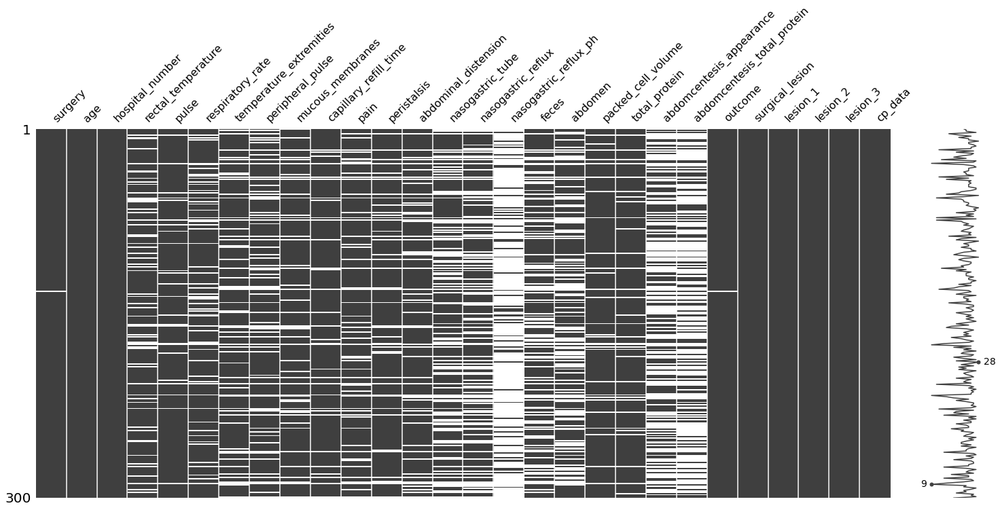

In [8]:
import missingno as mno
fig = mno.matrix(df_train)
fig_copy = fig.get_figure()
fig_copy.savefig('./data/smatrix_missing_plot.png', bbox_inches = 'tight')

In [9]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 28 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   surgery                      299 non-null    float64
 1   age                          300 non-null    int64  
 2   hospital_number              300 non-null    int64  
 3   rectal_temperature           240 non-null    float64
 4   pulse                        276 non-null    float64
 5   respiratory_rate             242 non-null    float64
 6   temperature_extremities      244 non-null    float64
 7   peripheral_pulse             231 non-null    float64
 8   mucous_membranes             253 non-null    float64
 9   capillary_refill_time        268 non-null    float64
 10  pain                         245 non-null    float64
 11  peristalsis                  256 non-null    float64
 12  abdominal_distension         244 non-null    float64
 13  nasogastric_tube    

En observant toutes les représentations graphiques que je viens de faire, nous pouvons voir qu'une énorme quantité de données sont manquantes. Effectivement le ProfileReport nous montre pour chaque attribut, la quantité de données manquantes. En effet, plusieurs valeurs possèdent un avertissement indiquant qu'elles possèdent des valeurs manquantes. Il s'agit de 19 features, ce qui représente la majorité de nos attributs dans l'ensemble de données. L'attribut nasogastric_reflux_ph possède 247 (82.3%) valeurs manquantes, les attributs surgery et outcome possèdent une valeur manquante chaque, mais ne sont pas affichés dans les avertissements. Le profile report nous permet aussi de voir la répartition des valeurs pour chaque attribut ce qui est intéressant. Nous pouvons voir aussi que la majorité des valeurs pour les attributs sont des nombres décimaux (21) et les autres sont des entiers (7).

## 3) La pertinence des caractéristiques 

En effectuant plusieurs recherches, j'ai trouvé l'article suivant: https://arxiv.org/pdf/1403.4540.pdf?fbclid=IwAR2WInl-dk62uxPxjTXseC2BuwTacxHSdCDQ7fm-LIn1ium-rZ8C2bj8dN8. Les auteurs indiquent que les attributs 3 et 28 ne fournissent pas d'information significative et peuvent par conséquent être ignorés. Il s'agit effectivement du numéro de l'hôpital et l'attribut 28 indique si les données pathologiques sont présentes ou pas. En effet, ces deux variables ont peu d'importance pour cette étude. Aussi pour l'attribut 28, dans l'ensemble de données, la note suivante est indiquée : this variable is of no significance since pathology data is not included or collected for these cases. Cela supporte la décision des auteurs de l'article en question. Les auteurs décident d'abandonner trois autres attributs, soit les attributs 25, 26 et 27. Puisque ces trois attributs représentent des informations alternatives et n'ajoutent aucune nouvelle information qui pourrait être utile à la classification.

In [10]:
columns_to_drop = ["hospital_number", "lesion_1", "lesion_2", "lesion_3", "cp_data"]
df_train_drop = df_train.drop(columns_to_drop, axis=1)
df_test_drop = df_test.drop(columns_to_drop, axis=1)
df_train_drop

,surgery,age,rectal_temperature,pulse,respiratory_rate,temperature_extremities,peripheral_pulse,mucous_membranes,capillary_refill_time,pain,...,nasogastric_reflux,nasogastric_reflux_ph,feces,abdomen,packed_cell_volume,total_protein,abdomcentesis_appearance,abdomcentesis_total_protein,outcome,surgical_lesion
0,2.0,1,38.5,66.0,28.0,3.0,3.0,NaN,2.0,5.0,...,NaN,NaN,3.0,5.0,45.0,8.4,NaN,NaN,2.0,2
1,1.0,1,39.2,88.0,20.0,NaN,NaN,4.0,1.0,3.0,...,NaN,NaN,4.0,2.0,50.0,85.0,2.0,2.0,3.0,2
2,2.0,1,38.3,40.0,24.0,1.0,1.0,3.0,1.0,3.0,...,NaN,NaN,1.0,1.0,33.0,6.7,NaN,NaN,1.0,2
3,1.0,9,39.1,164.0,84.0,4.0,1.0,6.0,2.0,2.0,...,2.0,5.0,3.0,NaN,48.0,7.2,3.0,5.3,2.0,1
4,2.0,1,37.3,104.0,35.0,NaN,NaN,6.0,2.0,NaN,...,NaN,NaN,NaN,NaN,74.0,7.4,NaN,NaN,2.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,1.0,1,NaN,120.0,70.0,4.0,NaN,4.0,2.0,2.0,...,NaN,NaN,NaN,5.0,55.0,65.0,NaN,NaN,3.0,2
296,2.0,1,37.2,72.0,24.0,3.0,2.0,4.0,2.0,4.0,...,1.0,NaN,4.0,4.0,44.0,NaN,3.0,3.3,3.0,1
297,1.0,1,37.5,72.0,30.0,4.0,3.0,4.0,1.0,4.0,...,1.0,NaN,3.0,5.0,60.0,6.8,NaN,NaN,2.0,1
298,1.0,1,36.5,100.0,24.0,3.0,3.0,3.0,1.0,3.0,...,1.0,NaN,4.0,4.0,50.0,6.0,3.0,3.4,1.0,1


### Beaucoup de valeurs missing

<AxesSubplot:>

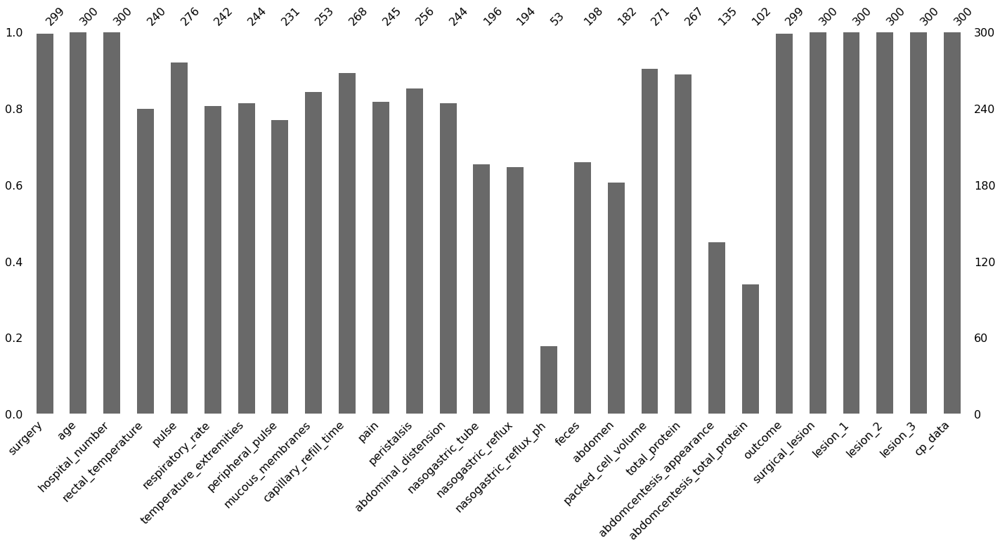

In [11]:
import missingno as msno 

msno.bar(df_train)

Text(0.5, 1.0, 'Variables')

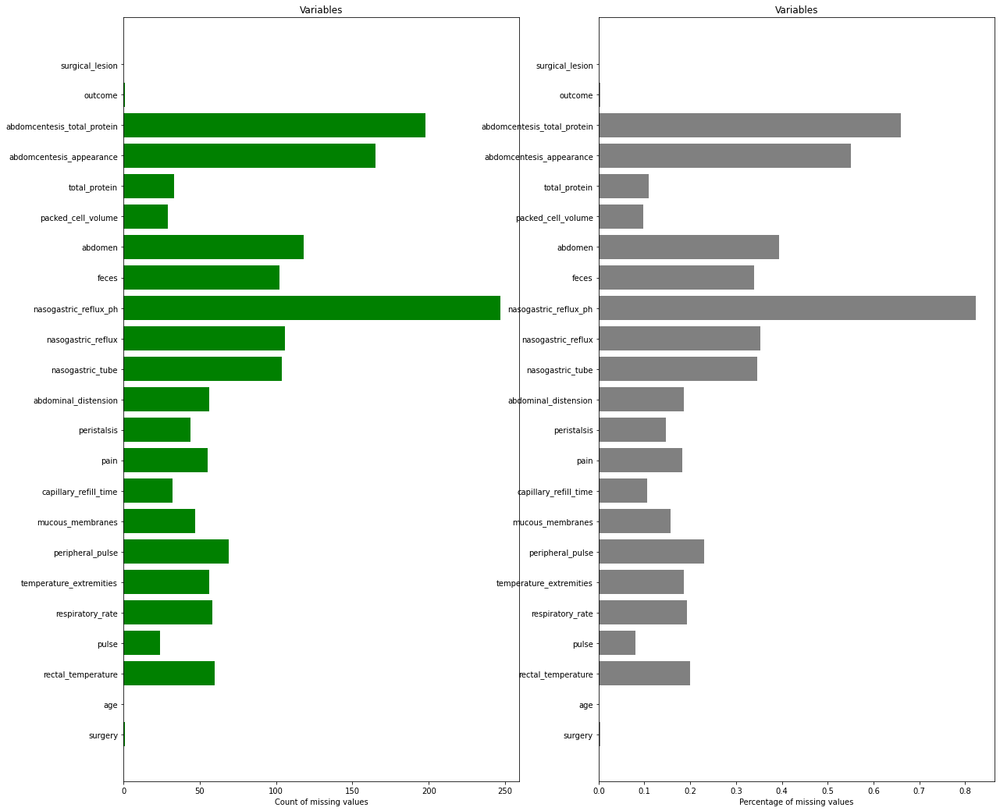

In [12]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

# Contient la liste des noms de variables 
variable_names = [] 

# Contient le nombre de données manquantes 
missing_count = [] 

# Contient les pourcentages de données manquantes
percent_missing = [] 

for col in df_train_drop.columns:
    variable_names.append(col)
    missing_count.append(df_train_drop[col].isnull().sum())
    percent_missing.append(df_train_drop[col].isnull().sum()/df_train_drop.shape[0])

ind = np.arange(len(variable_names))

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 18))

rects = ax1.barh(ind, np.array(missing_count), color='green')
ax1.set_yticks(ind)
ax1.set_yticklabels(variable_names, rotation='horizontal')
ax1.set_xlabel("Count of missing values")
ax1.set_title("Variables")

rects = ax2.barh(ind, np.array(percent_missing), color='gray')
ax2.set_yticks(ind)
ax2.set_yticklabels(variable_names, rotation='horizontal')
ax2.set_xlabel("Percentage of missing values")
ax2.set_title("Variables")

### En effectuant plusieurs recherches, j'ai décidé de retirer les colonnes avec 45% et plus des données manquantes

In [13]:
dropped_cols = []
for (percentage, col) in zip(percent_missing, df_train_drop.columns):
    if percentage >= 0.45:
        df_train_drop.drop(col, axis=1, inplace=True)
        df_test_drop.drop(col, axis=1, inplace=True)
        dropped_cols.append(col)
        

In [14]:
dropped_cols

['nasogastric_reflux_ph',
 'abdomcentesis_appearance',
 'abdomcentesis_total_protein']

In [15]:
df_train_drop

,surgery,age,rectal_temperature,pulse,respiratory_rate,temperature_extremities,peripheral_pulse,mucous_membranes,capillary_refill_time,pain,peristalsis,abdominal_distension,nasogastric_tube,nasogastric_reflux,feces,abdomen,packed_cell_volume,total_protein,outcome,surgical_lesion
0,2.0,1,38.5,66.0,28.0,3.0,3.0,NaN,2.0,5.0,4.0,4.0,NaN,NaN,3.0,5.0,45.0,8.4,2.0,2
1,1.0,1,39.2,88.0,20.0,NaN,NaN,4.0,1.0,3.0,4.0,2.0,NaN,NaN,4.0,2.0,50.0,85.0,3.0,2
2,2.0,1,38.3,40.0,24.0,1.0,1.0,3.0,1.0,3.0,3.0,1.0,NaN,NaN,1.0,1.0,33.0,6.7,1.0,2
3,1.0,9,39.1,164.0,84.0,4.0,1.0,6.0,2.0,2.0,4.0,4.0,1.0,2.0,3.0,NaN,48.0,7.2,2.0,1
4,2.0,1,37.3,104.0,35.0,NaN,NaN,6.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,74.0,7.4,2.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,1.0,1,NaN,120.0,70.0,4.0,NaN,4.0,2.0,2.0,4.0,NaN,NaN,NaN,NaN,5.0,55.0,65.0,3.0,2
296,2.0,1,37.2,72.0,24.0,3.0,2.0,4.0,2.0,4.0,3.0,3.0,3.0,1.0,4.0,4.0,44.0,NaN,3.0,1
297,1.0,1,37.5,72.0,30.0,4.0,3.0,4.0,1.0,4.0,4.0,3.0,2.0,1.0,3.0,5.0,60.0,6.8,2.0,1
298,1.0,1,36.5,100.0,24.0,3.0,3.0,3.0,1.0,3.0,3.0,3.0,3.0,1.0,4.0,4.0,50.0,6.0,1.0,1


### En effet, les colonnes suivantes avaient plus de 45% de leurs valeurs manquantes, alors elles ont été abandonnées.

In [16]:
dropped_cols

['nasogastric_reflux_ph',
 'abdomcentesis_appearance',
 'abdomcentesis_total_protein']

## 4) Le traitement des données manquantes

In [17]:
class TreatMissing():
    def __init__(self, df_train, df_test):
        self.train_dfs = []
        self.test_dfs = []
        self.df_train = df_train
        self.df_test = df_test
    
    def apply_treatment(self, imputer=None):
        if imputer is not None:
            df_train_transformed = pd.DataFrame(imputer.fit_transform(self.df_train))
            df_train_transformed.columns = self.df_train.columns
            df_train_transformed.index = self.df_train.index

            df_test_transformed = pd.DataFrame(imputer.transform(self.df_test))
            df_test_transformed.columns = self.df_test.columns
            df_test_transformed.index = self.df_test.index
        else:
            df_train_transformed = self.df_train.dropna()
            df_test_transformed = self.df_test.dropna()
        
        # Ajout des dataframes aux listes de dataframes
        self.train_dfs.append(df_train_transformed)
        self.test_dfs.append(df_test_transformed)      

In [18]:
treat = TreatMissing(df_train_drop, df_test_drop)

### a) On laisse tomber toutes les valeurs manquantes: on retire du jeu de données toutes les lignes qui ont une valeur manquante

In [19]:
treat.apply_treatment()

In [20]:
treat.train_dfs[0].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 52 entries, 6 to 298
Data columns (total 20 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   surgery                  52 non-null     float64
 1   age                      52 non-null     int64  
 2   rectal_temperature       52 non-null     float64
 3   pulse                    52 non-null     float64
 4   respiratory_rate         52 non-null     float64
 5   temperature_extremities  52 non-null     float64
 6   peripheral_pulse         52 non-null     float64
 7   mucous_membranes         52 non-null     float64
 8   capillary_refill_time    52 non-null     float64
 9   pain                     52 non-null     float64
 10  peristalsis              52 non-null     float64
 11  abdominal_distension     52 non-null     float64
 12  nasogastric_tube         52 non-null     float64
 13  nasogastric_reflux       52 non-null     float64
 14  feces                    52

In [21]:
treat.test_dfs[0].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9 entries, 6 to 65
Data columns (total 20 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   surgery                  9 non-null      float64
 1   age                      9 non-null      int64  
 2   rectal_temperature       9 non-null      float64
 3   pulse                    9 non-null      float64
 4   respiratory_rate         9 non-null      float64
 5   temperature_extremities  9 non-null      float64
 6   peripheral_pulse         9 non-null      float64
 7   mucous_membranes         9 non-null      float64
 8   capillary_refill_time    9 non-null      float64
 9   pain                     9 non-null      float64
 10  peristalsis              9 non-null      float64
 11  abdominal_distension     9 non-null      float64
 12  nasogastric_tube         9 non-null      float64
 13  nasogastric_reflux       9 non-null      float64
 14  feces                    9 no

### b) On remplace les données manquantes par la moyenne de leur groupe

In [22]:
from sklearn.impute import SimpleImputer

imp_mean = SimpleImputer(missing_values=np.nan, strategy='mean')
treat.apply_treatment(imputer=imp_mean)

#### Before

In [23]:
df_test_drop.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 68 entries, 0 to 67
Data columns (total 20 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   surgery                  67 non-null     float64
 1   age                      68 non-null     int64  
 2   rectal_temperature       59 non-null     float64
 3   pulse                    66 non-null     float64
 4   respiratory_rate         55 non-null     float64
 5   temperature_extremities  59 non-null     float64
 6   peripheral_pulse         54 non-null     float64
 7   mucous_membranes         67 non-null     float64
 8   capillary_refill_time    62 non-null     float64
 9   pain                     60 non-null     float64
 10  peristalsis              60 non-null     float64
 11  abdominal_distension     59 non-null     float64
 12  nasogastric_tube         41 non-null     float64
 13  nasogastric_reflux       41 non-null     float64
 14  feces                    42 

In [24]:
df_train_drop

,surgery,age,rectal_temperature,pulse,respiratory_rate,temperature_extremities,peripheral_pulse,mucous_membranes,capillary_refill_time,pain,peristalsis,abdominal_distension,nasogastric_tube,nasogastric_reflux,feces,abdomen,packed_cell_volume,total_protein,outcome,surgical_lesion
0,2.0,1,38.5,66.0,28.0,3.0,3.0,NaN,2.0,5.0,4.0,4.0,NaN,NaN,3.0,5.0,45.0,8.4,2.0,2
1,1.0,1,39.2,88.0,20.0,NaN,NaN,4.0,1.0,3.0,4.0,2.0,NaN,NaN,4.0,2.0,50.0,85.0,3.0,2
2,2.0,1,38.3,40.0,24.0,1.0,1.0,3.0,1.0,3.0,3.0,1.0,NaN,NaN,1.0,1.0,33.0,6.7,1.0,2
3,1.0,9,39.1,164.0,84.0,4.0,1.0,6.0,2.0,2.0,4.0,4.0,1.0,2.0,3.0,NaN,48.0,7.2,2.0,1
4,2.0,1,37.3,104.0,35.0,NaN,NaN,6.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,74.0,7.4,2.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,1.0,1,NaN,120.0,70.0,4.0,NaN,4.0,2.0,2.0,4.0,NaN,NaN,NaN,NaN,5.0,55.0,65.0,3.0,2
296,2.0,1,37.2,72.0,24.0,3.0,2.0,4.0,2.0,4.0,3.0,3.0,3.0,1.0,4.0,4.0,44.0,NaN,3.0,1
297,1.0,1,37.5,72.0,30.0,4.0,3.0,4.0,1.0,4.0,4.0,3.0,2.0,1.0,3.0,5.0,60.0,6.8,2.0,1
298,1.0,1,36.5,100.0,24.0,3.0,3.0,3.0,1.0,3.0,3.0,3.0,3.0,1.0,4.0,4.0,50.0,6.0,1.0,1


#### After

In [25]:
treat.train_dfs[1]

,surgery,age,rectal_temperature,pulse,respiratory_rate,temperature_extremities,peripheral_pulse,mucous_membranes,capillary_refill_time,pain,peristalsis,abdominal_distension,nasogastric_tube,nasogastric_reflux,feces,abdomen,packed_cell_volume,total_protein,outcome,surgical_lesion
0,2.0,1.0,38.500000,66.0,28.0,3.000000,3.000000,2.853755,2.00000,5.00000,4.000000,4.000000,1.755102,1.582474,3.000000,5.000000,45.0,8.400000,2.0,2.0
1,1.0,1.0,39.200000,88.0,20.0,2.348361,2.017316,4.000000,1.00000,3.00000,4.000000,2.000000,1.755102,1.582474,4.000000,2.000000,50.0,85.000000,3.0,2.0
2,2.0,1.0,38.300000,40.0,24.0,1.000000,1.000000,3.000000,1.00000,3.00000,3.000000,1.000000,1.755102,1.582474,1.000000,1.000000,33.0,6.700000,1.0,2.0
3,1.0,9.0,39.100000,164.0,84.0,4.000000,1.000000,6.000000,2.00000,2.00000,4.000000,4.000000,1.000000,2.000000,3.000000,3.692308,48.0,7.200000,2.0,1.0
4,2.0,1.0,37.300000,104.0,35.0,2.348361,2.017316,6.000000,2.00000,2.95102,2.917969,2.266393,1.755102,1.582474,2.757576,3.692308,74.0,7.400000,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,1.0,1.0,38.167917,120.0,70.0,4.000000,2.017316,4.000000,2.00000,2.00000,4.000000,2.266393,1.755102,1.582474,2.757576,5.000000,55.0,65.000000,3.0,2.0
296,2.0,1.0,37.200000,72.0,24.0,3.000000,2.000000,4.000000,2.00000,4.00000,3.000000,3.000000,3.000000,1.000000,4.000000,4.000000,44.0,24.456929,3.0,1.0
297,1.0,1.0,37.500000,72.0,30.0,4.000000,3.000000,4.000000,1.00000,4.00000,4.000000,3.000000,2.000000,1.000000,3.000000,5.000000,60.0,6.800000,2.0,1.0
298,1.0,1.0,36.500000,100.0,24.0,3.000000,3.000000,3.000000,1.00000,3.00000,3.000000,3.000000,3.000000,1.000000,4.000000,4.000000,50.0,6.000000,1.0,1.0


In [26]:
treat.test_dfs[1]

,surgery,age,rectal_temperature,pulse,respiratory_rate,temperature_extremities,peripheral_pulse,mucous_membranes,capillary_refill_time,pain,peristalsis,abdominal_distension,nasogastric_tube,nasogastric_reflux,feces,abdomen,packed_cell_volume,total_protein,outcome,surgical_lesion
0,2.0,1.0,38.5,54.0,20.0,2.348361,1.000000,2.0,2.0,3.00000,4.000000,1.000000,2.000000,2.000000,2.757576,2.000000,42.0,6.3,1.0,2.0
1,2.0,1.0,37.6,48.0,36.0,2.348361,2.017316,1.0,1.0,2.95102,3.000000,2.266393,1.755102,1.582474,2.757576,3.692308,44.0,6.3,1.0,2.0
2,1.0,1.0,37.7,44.0,28.0,2.348361,4.000000,3.0,2.0,5.00000,4.000000,4.000000,1.000000,1.000000,3.000000,5.000000,45.0,70.0,1.0,1.0
3,1.0,1.0,37.0,56.0,24.0,3.000000,1.000000,4.0,2.0,4.00000,4.000000,3.000000,1.000000,1.000000,2.757576,3.692308,35.0,61.0,3.0,2.0
4,2.0,1.0,38.0,42.0,12.0,3.000000,2.017316,3.0,1.0,1.00000,2.917969,1.000000,1.755102,1.582474,2.757576,2.000000,37.0,5.8,1.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63,2.0,1.0,38.6,60.0,30.0,1.000000,1.000000,3.0,1.0,4.00000,2.000000,2.000000,1.000000,1.000000,2.757576,3.692308,40.0,6.0,1.0,1.0
64,2.0,1.0,37.8,42.0,40.0,1.000000,1.000000,1.0,1.0,1.00000,3.000000,1.000000,1.755102,1.582474,3.000000,3.000000,36.0,6.2,1.0,2.0
65,1.0,1.0,38.0,60.0,12.0,1.000000,1.000000,2.0,1.0,2.00000,1.000000,1.000000,1.000000,1.000000,1.000000,4.000000,44.0,65.0,3.0,1.0
66,2.0,1.0,38.0,42.0,12.0,3.000000,2.017316,3.0,1.0,1.00000,1.000000,1.000000,1.755102,1.582474,2.757576,1.000000,37.0,5.8,1.0,2.0


### c) On remplace les données manquantes par la médiane de leur groupe

In [27]:
imp_median = SimpleImputer(missing_values=np.nan, strategy='median')
treat.apply_treatment(imputer=imp_median)

In [28]:
treat.train_dfs[2]

,surgery,age,rectal_temperature,pulse,respiratory_rate,temperature_extremities,peripheral_pulse,mucous_membranes,capillary_refill_time,pain,peristalsis,abdominal_distension,nasogastric_tube,nasogastric_reflux,feces,abdomen,packed_cell_volume,total_protein,outcome,surgical_lesion
0,2.0,1.0,38.5,66.0,28.0,3.0,3.0,3.0,2.0,5.0,4.0,4.0,2.0,1.0,3.0,5.0,45.0,8.4,2.0,2.0
1,1.0,1.0,39.2,88.0,20.0,3.0,2.0,4.0,1.0,3.0,4.0,2.0,2.0,1.0,4.0,2.0,50.0,85.0,3.0,2.0
2,2.0,1.0,38.3,40.0,24.0,1.0,1.0,3.0,1.0,3.0,3.0,1.0,2.0,1.0,1.0,1.0,33.0,6.7,1.0,2.0
3,1.0,9.0,39.1,164.0,84.0,4.0,1.0,6.0,2.0,2.0,4.0,4.0,1.0,2.0,3.0,4.0,48.0,7.2,2.0,1.0
4,2.0,1.0,37.3,104.0,35.0,3.0,2.0,6.0,2.0,3.0,3.0,2.0,2.0,1.0,3.0,4.0,74.0,7.4,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,1.0,1.0,38.2,120.0,70.0,4.0,2.0,4.0,2.0,2.0,4.0,2.0,2.0,1.0,3.0,5.0,55.0,65.0,3.0,2.0
296,2.0,1.0,37.2,72.0,24.0,3.0,2.0,4.0,2.0,4.0,3.0,3.0,3.0,1.0,4.0,4.0,44.0,7.5,3.0,1.0
297,1.0,1.0,37.5,72.0,30.0,4.0,3.0,4.0,1.0,4.0,4.0,3.0,2.0,1.0,3.0,5.0,60.0,6.8,2.0,1.0
298,1.0,1.0,36.5,100.0,24.0,3.0,3.0,3.0,1.0,3.0,3.0,3.0,3.0,1.0,4.0,4.0,50.0,6.0,1.0,1.0


### d) On utilise les voisins immédiats pour trouver la bonne valeur

In [29]:
from sklearn.impute import KNNImputer

imputer = KNNImputer(n_neighbors=2, weights="uniform")
treat.apply_treatment(imputer=imputer)

In [30]:
treat.train_dfs[3]

,surgery,age,rectal_temperature,pulse,respiratory_rate,temperature_extremities,peripheral_pulse,mucous_membranes,capillary_refill_time,pain,peristalsis,abdominal_distension,nasogastric_tube,nasogastric_reflux,feces,abdomen,packed_cell_volume,total_protein,outcome,surgical_lesion
0,2.0,1.0,38.50,66.0,28.0,3.0,3.0,5.0,2.0,5.0,4.0,4.0,3.0,2.5,3.0,5.0,45.0,8.4,2.0,2.0
1,1.0,1.0,39.20,88.0,20.0,2.5,2.5,4.0,1.0,3.0,4.0,2.0,2.0,1.0,4.0,2.0,50.0,85.0,3.0,2.0
2,2.0,1.0,38.30,40.0,24.0,1.0,1.0,3.0,1.0,3.0,3.0,1.0,2.0,1.0,1.0,1.0,33.0,6.7,1.0,2.0
3,1.0,9.0,39.10,164.0,84.0,4.0,1.0,6.0,2.0,2.0,4.0,4.0,1.0,2.0,3.0,5.0,48.0,7.2,2.0,1.0
4,2.0,1.0,37.30,104.0,35.0,3.5,3.5,6.0,2.0,4.0,4.0,3.0,1.5,3.0,4.0,4.5,74.0,7.4,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,1.0,1.0,38.25,120.0,70.0,4.0,2.5,4.0,2.0,2.0,4.0,3.0,1.5,1.0,3.0,5.0,55.0,65.0,3.0,2.0
296,2.0,1.0,37.20,72.0,24.0,3.0,2.0,4.0,2.0,4.0,3.0,3.0,3.0,1.0,4.0,4.0,44.0,7.3,3.0,1.0
297,1.0,1.0,37.50,72.0,30.0,4.0,3.0,4.0,1.0,4.0,4.0,3.0,2.0,1.0,3.0,5.0,60.0,6.8,2.0,1.0
298,1.0,1.0,36.50,100.0,24.0,3.0,3.0,3.0,1.0,3.0,3.0,3.0,3.0,1.0,4.0,4.0,50.0,6.0,1.0,1.0


### e) On utilise la régression linéaire pour trouver la bonne valeur

In [31]:
from sklearn.impute._iterative import IterativeImputer
from sklearn.linear_model import LinearRegression

lin_reg_imputer = IterativeImputer(estimator=LinearRegression(), random_state=seed)
treat.apply_treatment(imputer=lin_reg_imputer)

C:\Users\JadEl-Asmar\Anaconda3\envs\mypython3\lib\site-packages\sklearn\impute\_iterative.py:669: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn("[IterativeImputer] Early stopping criterion not"


In [32]:
treat.train_dfs[4]

,surgery,age,rectal_temperature,pulse,respiratory_rate,temperature_extremities,peripheral_pulse,mucous_membranes,capillary_refill_time,pain,peristalsis,abdominal_distension,nasogastric_tube,nasogastric_reflux,feces,abdomen,packed_cell_volume,total_protein,outcome,surgical_lesion
0,2.0,1.0,38.500000,66.0,28.0,3.000000,3.000000,3.568421,2.000000,5.000000,4.00000,4.000000,2.020919,1.178164,3.000000,5.000000,45.0,8.400000,2.0,2.0
1,1.0,1.0,39.200000,88.0,20.0,3.401235,2.437577,4.000000,1.000000,3.000000,4.00000,2.000000,1.978648,1.790586,4.000000,2.000000,50.0,85.000000,3.0,2.0
2,2.0,1.0,38.300000,40.0,24.0,1.000000,1.000000,3.000000,1.000000,3.000000,3.00000,1.000000,1.795832,1.265264,1.000000,1.000000,33.0,6.700000,1.0,2.0
3,1.0,9.0,39.100000,164.0,84.0,4.000000,1.000000,6.000000,2.000000,2.000000,4.00000,4.000000,1.000000,2.000000,3.000000,4.261331,48.0,7.200000,2.0,1.0
4,2.0,1.0,37.300000,104.0,35.0,3.003517,3.259314,6.000000,2.000000,3.326790,3.53573,2.740748,1.874406,2.241077,3.374143,3.179723,74.0,7.400000,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,1.0,1.0,38.862087,120.0,70.0,4.000000,3.866970,4.000000,2.000000,2.000000,4.00000,3.493510,1.688190,2.056698,4.018678,5.000000,55.0,65.000000,3.0,2.0
296,2.0,1.0,37.200000,72.0,24.0,3.000000,2.000000,4.000000,2.000000,4.000000,3.00000,3.000000,3.000000,1.000000,4.000000,4.000000,44.0,14.730498,3.0,1.0
297,1.0,1.0,37.500000,72.0,30.0,4.000000,3.000000,4.000000,1.000000,4.000000,4.00000,3.000000,2.000000,1.000000,3.000000,5.000000,60.0,6.800000,2.0,1.0
298,1.0,1.0,36.500000,100.0,24.0,3.000000,3.000000,3.000000,1.000000,3.000000,3.00000,3.000000,3.000000,1.000000,4.000000,4.000000,50.0,6.000000,1.0,1.0


### f) Ma technique: On remplace par le mode, soit la donnée la plus fréquente de la colonne

J'ai décidé de remplacer les valeurs manquantes par le mode, soit la valeur la plus fréquente de chaque attribut.

In [33]:
imp_mode = SimpleImputer(missing_values=np.nan, strategy='most_frequent')
treat.apply_treatment(imputer=imp_mode)

In [34]:
treat.train_dfs[5]

,surgery,age,rectal_temperature,pulse,respiratory_rate,temperature_extremities,peripheral_pulse,mucous_membranes,capillary_refill_time,pain,peristalsis,abdominal_distension,nasogastric_tube,nasogastric_reflux,feces,abdomen,packed_cell_volume,total_protein,outcome,surgical_lesion
0,2.0,1.0,38.5,66.0,28.0,3.0,3.0,1.0,2.0,5.0,4.0,4.0,2.0,1.0,3.0,5.0,45.0,8.4,2.0,2.0
1,1.0,1.0,39.2,88.0,20.0,3.0,1.0,4.0,1.0,3.0,4.0,2.0,2.0,1.0,4.0,2.0,50.0,85.0,3.0,2.0
2,2.0,1.0,38.3,40.0,24.0,1.0,1.0,3.0,1.0,3.0,3.0,1.0,2.0,1.0,1.0,1.0,33.0,6.7,1.0,2.0
3,1.0,9.0,39.1,164.0,84.0,4.0,1.0,6.0,2.0,2.0,4.0,4.0,1.0,2.0,3.0,5.0,48.0,7.2,2.0,1.0
4,2.0,1.0,37.3,104.0,35.0,3.0,1.0,6.0,2.0,3.0,3.0,1.0,2.0,1.0,4.0,5.0,74.0,7.4,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,1.0,1.0,38.0,120.0,70.0,4.0,1.0,4.0,2.0,2.0,4.0,1.0,2.0,1.0,4.0,5.0,55.0,65.0,3.0,2.0
296,2.0,1.0,37.2,72.0,24.0,3.0,2.0,4.0,2.0,4.0,3.0,3.0,3.0,1.0,4.0,4.0,44.0,6.5,3.0,1.0
297,1.0,1.0,37.5,72.0,30.0,4.0,3.0,4.0,1.0,4.0,4.0,3.0,2.0,1.0,3.0,5.0,60.0,6.8,2.0,1.0
298,1.0,1.0,36.5,100.0,24.0,3.0,3.0,3.0,1.0,3.0,3.0,3.0,3.0,1.0,4.0,4.0,50.0,6.0,1.0,1.0


## 5) L'apprentissage automatique et 6) Analyse des résultats

### Séparation des attributs du target

In [35]:
import pandas as pd 

train_data = []
test_data = []

for (train, test) in zip(treat.train_dfs, treat.test_dfs):
    y_train = train["surgical_lesion"]
    X_train = train.drop(["surgical_lesion"], axis=1)
    y_test = test["surgical_lesion"]
    X_test = test.drop(["surgical_lesion"], axis=1)
    train_data.append((X_train, y_train.astype(int)))
    test_data.append((X_test, y_test.astype(int)))

In [36]:
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, classification_report, plot_confusion_matrix, plot_roc_curve
    
class MyAlgorithm:
    def __init__(self, algorithm, train_data, test_data):
        self.algorithm = algorithm
        self.train_data = train_data
        self.test_data = test_data
        self.techniques = ["Drop NaN", "Mean", "Median", "Neighbors", "Linear Regression", "Mode"]
        self.predictions = []
    
    def build_algorithm(self):
        for (train, test, name) in zip(self.train_data, self.test_data, self.techniques):
            self.algorithm .fit(train[0], train[1])
            self.predictions.append(self.algorithm.predict(test[0]))
            self.get_metrics(name, test[0], test[1])
        
        
    def get_accuracies(self):
        accuracies = []
        for i in range(len(self.predictions)):
            y_test = self.test_data[i][1]
            accuracies.append(accuracy_score(y_test, self.predictions[i]))
        return accuracies
    
    def get_metrics(self, name, test_data, actual_values):
        print(str(name) + ": ")
        predictions = self.algorithm.predict(test_data)
        print("Rapport de classification: ")
        print(classification_report(predictions, actual_values))
        print("Matrice de confusion: ")
        plot_confusion_matrix(self.algorithm, test_data, actual_values) 
        plt.show() 
        print("Courbes ROC")
        probas = self.algorithm.predict_proba(test_data)
        false_positive1, true_positive1, thresholds1 = roc_curve(actual_values, probas[:, 0], pos_label=1)
        false_positive2, true_positive2, thresholds2 = roc_curve(actual_values, probas[:, 1], pos_label=2)
        plt.plot(false_positive1, true_positive1)
        plt.plot(false_positive2, true_positive2)
        plt.show()

### Naive Bayes

Drop NaN: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.67      0.80      0.73         5
           2       0.67      0.50      0.57         4

    accuracy                           0.67         9
   macro avg       0.67      0.65      0.65         9
weighted avg       0.67      0.67      0.66         9

Matrice de confusion: 


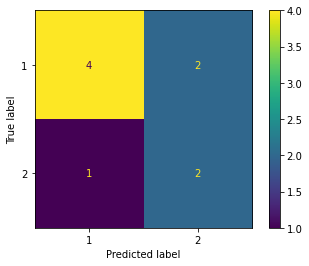

Courbes ROC


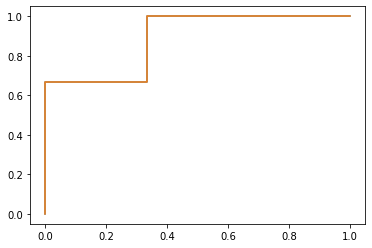

Mean: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.73      0.88      0.80        34
           2       0.85      0.68      0.75        34

    accuracy                           0.78        68
   macro avg       0.79      0.78      0.78        68
weighted avg       0.79      0.78      0.78        68

Matrice de confusion: 


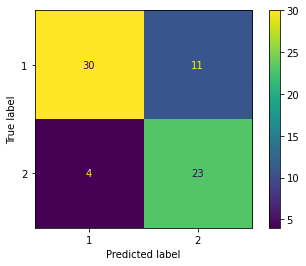

Courbes ROC


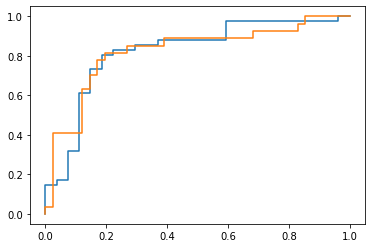

Median: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.73      0.88      0.80        34
           2       0.85      0.68      0.75        34

    accuracy                           0.78        68
   macro avg       0.79      0.78      0.78        68
weighted avg       0.79      0.78      0.78        68

Matrice de confusion: 


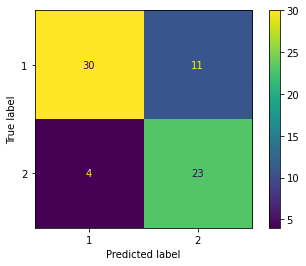

Courbes ROC


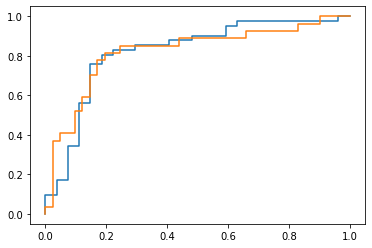

Neighbors: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.66      0.84      0.74        32
           2       0.81      0.61      0.70        36

    accuracy                           0.72        68
   macro avg       0.74      0.73      0.72        68
weighted avg       0.74      0.72      0.72        68

Matrice de confusion: 


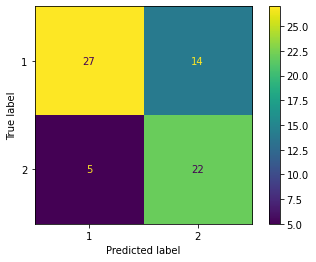

Courbes ROC


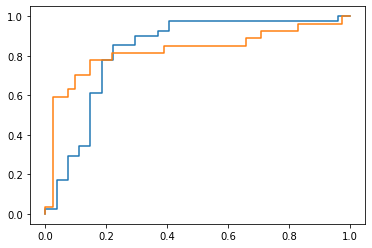

Linear Regression: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.73      0.86      0.79        35
           2       0.81      0.67      0.73        33

    accuracy                           0.76        68
   macro avg       0.77      0.76      0.76        68
weighted avg       0.77      0.76      0.76        68

Matrice de confusion: 


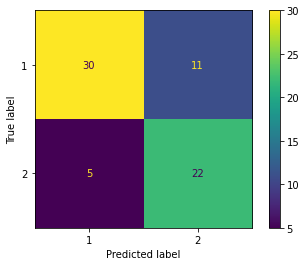

Courbes ROC


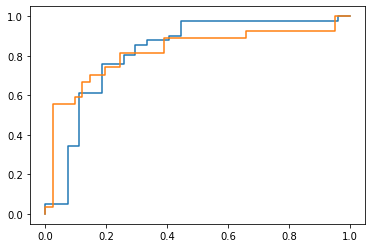

Mode: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.71      0.88      0.78        33
           2       0.85      0.66      0.74        35

    accuracy                           0.76        68
   macro avg       0.78      0.77      0.76        68
weighted avg       0.78      0.76      0.76        68

Matrice de confusion: 


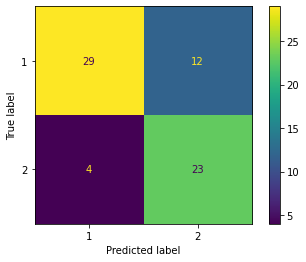

Courbes ROC


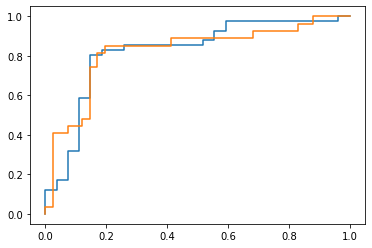

In [37]:
from sklearn.naive_bayes import GaussianNB

naive_bayes = MyAlgorithm(GaussianNB(), train_data, test_data)
naive_bayes.build_algorithm()
nb_accuracies = naive_bayes.get_accuracies()


In [38]:
nb_accuracies

[0.6666666666666666,
 0.7794117647058824,
 0.7794117647058824,
 0.7205882352941176,
 0.7647058823529411,
 0.7647058823529411]

### Régression Logistique

Drop NaN: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.83      0.83      0.83         6
           2       0.67      0.67      0.67         3

    accuracy                           0.78         9
   macro avg       0.75      0.75      0.75         9
weighted avg       0.78      0.78      0.78         9

Matrice de confusion: 


C:\Users\JadEl-Asmar\Anaconda3\envs\mypython3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


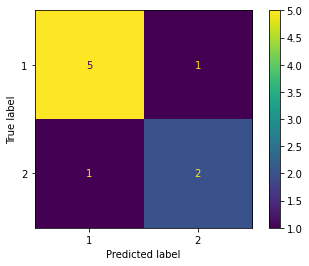

Courbes ROC


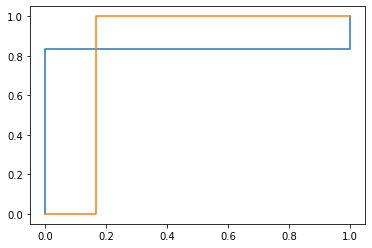

Mean: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.83      0.92      0.87        37
           2       0.89      0.77      0.83        31

    accuracy                           0.85        68
   macro avg       0.86      0.85      0.85        68
weighted avg       0.86      0.85      0.85        68

Matrice de confusion: 


C:\Users\JadEl-Asmar\Anaconda3\envs\mypython3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


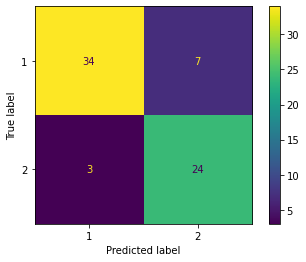

Courbes ROC


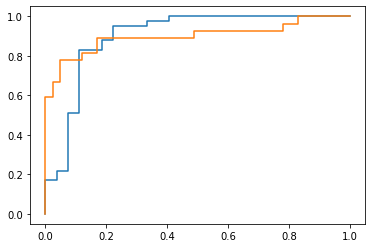

Median: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.83      0.92      0.87        37
           2       0.89      0.77      0.83        31

    accuracy                           0.85        68
   macro avg       0.86      0.85      0.85        68
weighted avg       0.86      0.85      0.85        68

Matrice de confusion: 


C:\Users\JadEl-Asmar\Anaconda3\envs\mypython3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


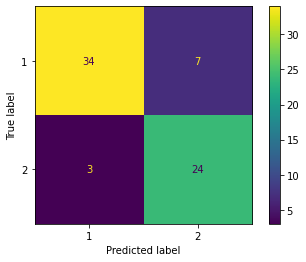

Courbes ROC


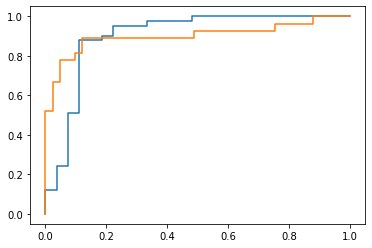

Neighbors: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.78      0.86      0.82        37
           2       0.81      0.71      0.76        31

    accuracy                           0.79        68
   macro avg       0.80      0.79      0.79        68
weighted avg       0.80      0.79      0.79        68

Matrice de confusion: 


C:\Users\JadEl-Asmar\Anaconda3\envs\mypython3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


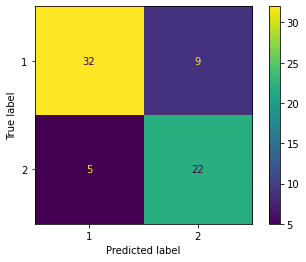

Courbes ROC


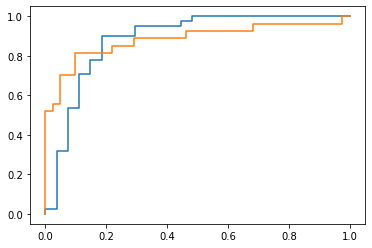

Linear Regression: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.80      0.87      0.84        38
           2       0.81      0.73      0.77        30

    accuracy                           0.81        68
   macro avg       0.81      0.80      0.80        68
weighted avg       0.81      0.81      0.81        68

Matrice de confusion: 


C:\Users\JadEl-Asmar\Anaconda3\envs\mypython3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


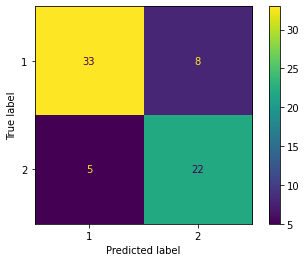

Courbes ROC


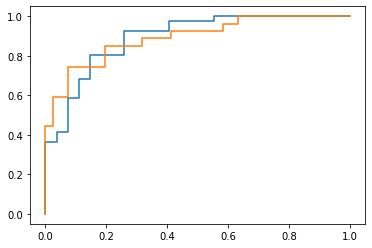

Mode: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.83      0.92      0.87        37
           2       0.89      0.77      0.83        31

    accuracy                           0.85        68
   macro avg       0.86      0.85      0.85        68
weighted avg       0.86      0.85      0.85        68

Matrice de confusion: 


C:\Users\JadEl-Asmar\Anaconda3\envs\mypython3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


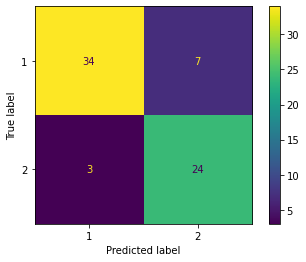

Courbes ROC


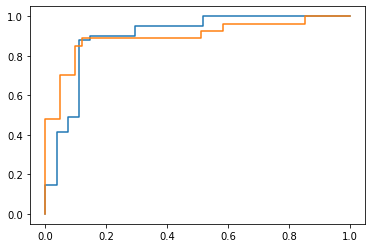

In [39]:
from sklearn.linear_model import LogisticRegression

logistic_regression = MyAlgorithm(LogisticRegression(random_state=seed) , train_data, test_data)
logistic_regression.build_algorithm()
lg_accuracies = logistic_regression.get_accuracies()

In [40]:
lg_accuracies

[0.7777777777777778,
 0.8529411764705882,
 0.8529411764705882,
 0.7941176470588235,
 0.8088235294117647,
 0.8529411764705882]

### Decision Tree

Drop NaN: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.83      1.00      0.91         5
           2       1.00      0.75      0.86         4

    accuracy                           0.89         9
   macro avg       0.92      0.88      0.88         9
weighted avg       0.91      0.89      0.89         9

Matrice de confusion: 


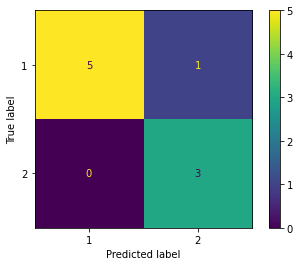

Courbes ROC


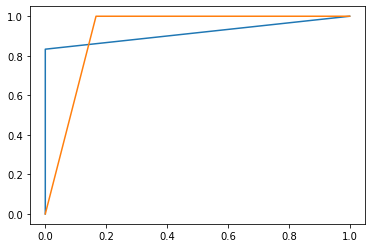

Mean: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.76      0.84      0.79        37
           2       0.78      0.68      0.72        31

    accuracy                           0.76        68
   macro avg       0.77      0.76      0.76        68
weighted avg       0.77      0.76      0.76        68

Matrice de confusion: 


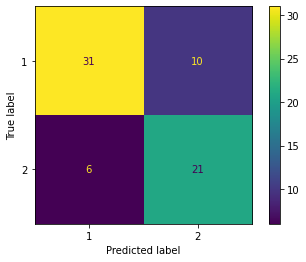

Courbes ROC


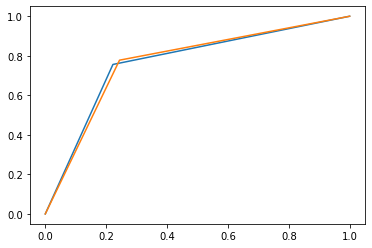

Median: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.76      0.86      0.81        36
           2       0.81      0.69      0.75        32

    accuracy                           0.78        68
   macro avg       0.79      0.77      0.78        68
weighted avg       0.78      0.78      0.78        68

Matrice de confusion: 


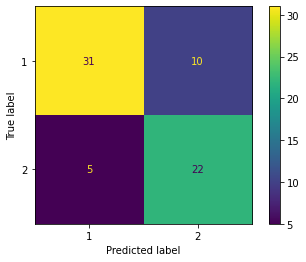

Courbes ROC


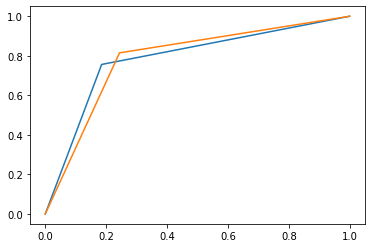

Neighbors: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.78      0.86      0.82        37
           2       0.81      0.71      0.76        31

    accuracy                           0.79        68
   macro avg       0.80      0.79      0.79        68
weighted avg       0.80      0.79      0.79        68

Matrice de confusion: 


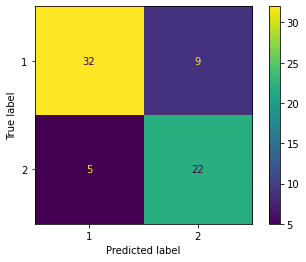

Courbes ROC


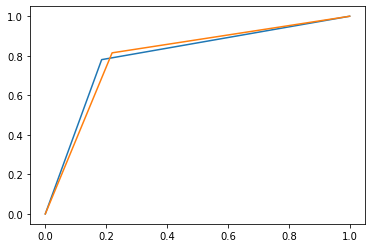

Linear Regression: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.76      0.86      0.81        36
           2       0.81      0.69      0.75        32

    accuracy                           0.78        68
   macro avg       0.79      0.77      0.78        68
weighted avg       0.78      0.78      0.78        68

Matrice de confusion: 


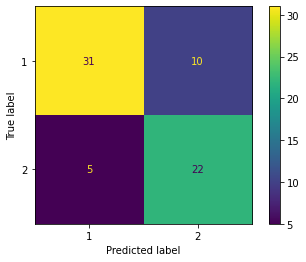

Courbes ROC


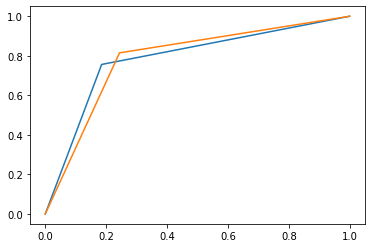

Mode: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.80      0.85      0.83        39
           2       0.78      0.72      0.75        29

    accuracy                           0.79        68
   macro avg       0.79      0.79      0.79        68
weighted avg       0.79      0.79      0.79        68

Matrice de confusion: 


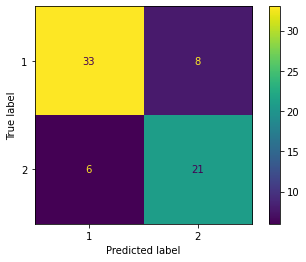

Courbes ROC


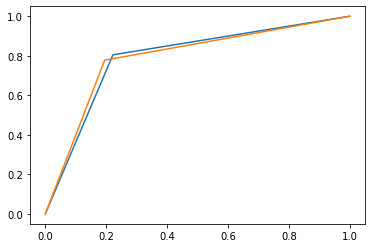

In [41]:
from sklearn.tree import DecisionTreeClassifier

decision_tree = MyAlgorithm(DecisionTreeClassifier(random_state=seed) , train_data, test_data)
decision_tree.build_algorithm()
decision_tree_accuracies = decision_tree.get_accuracies()

In [42]:
decision_tree_accuracies

[0.8888888888888888,
 0.7647058823529411,
 0.7794117647058824,
 0.7941176470588235,
 0.7794117647058824,
 0.7941176470588235]

### KNN

Drop NaN: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       1.00      0.75      0.86         8
           2       0.33      1.00      0.50         1

    accuracy                           0.78         9
   macro avg       0.67      0.88      0.68         9
weighted avg       0.93      0.78      0.82         9

Matrice de confusion: 


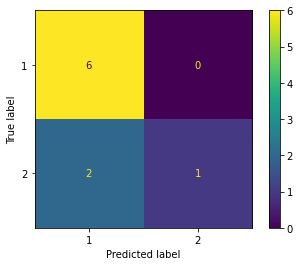

Courbes ROC


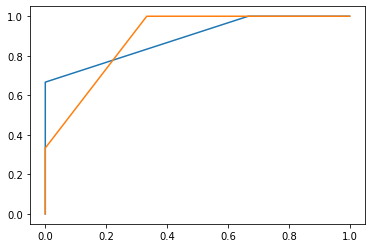

Mean: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.73      0.75      0.74        40
           2       0.63      0.61      0.62        28

    accuracy                           0.69        68
   macro avg       0.68      0.68      0.68        68
weighted avg       0.69      0.69      0.69        68

Matrice de confusion: 


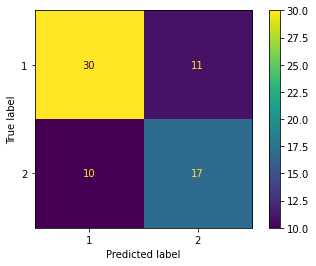

Courbes ROC


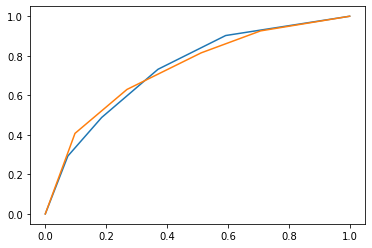

Median: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.80      0.77      0.79        43
           2       0.63      0.68      0.65        25

    accuracy                           0.74        68
   macro avg       0.72      0.72      0.72        68
weighted avg       0.74      0.74      0.74        68

Matrice de confusion: 


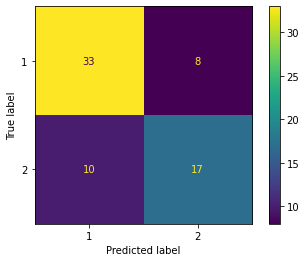

Courbes ROC


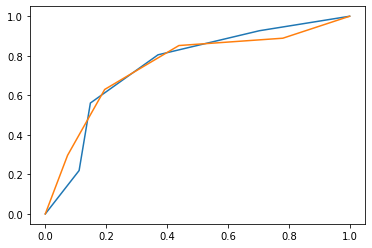

Neighbors: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.73      0.71      0.72        42
           2       0.56      0.58      0.57        26

    accuracy                           0.66        68
   macro avg       0.64      0.65      0.64        68
weighted avg       0.66      0.66      0.66        68

Matrice de confusion: 


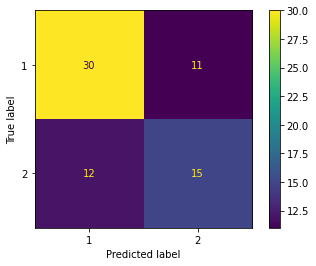

Courbes ROC


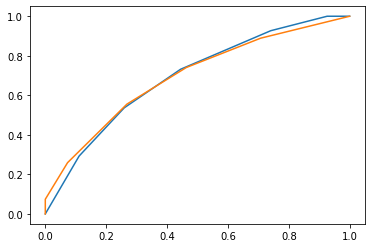

Linear Regression: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.78      0.76      0.77        42
           2       0.63      0.65      0.64        26

    accuracy                           0.72        68
   macro avg       0.71      0.71      0.71        68
weighted avg       0.72      0.72      0.72        68

Matrice de confusion: 


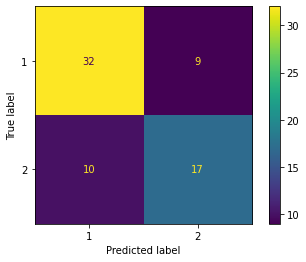

Courbes ROC


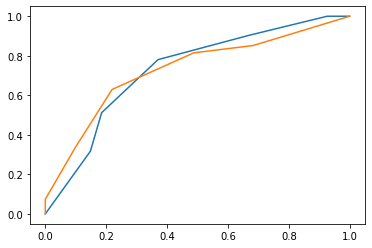

Mode: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.83      0.74      0.78        46
           2       0.56      0.68      0.61        22

    accuracy                           0.72        68
   macro avg       0.69      0.71      0.70        68
weighted avg       0.74      0.72      0.73        68

Matrice de confusion: 


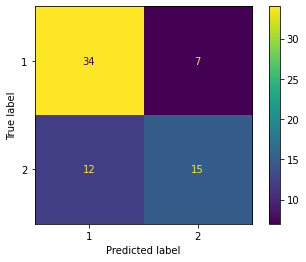

Courbes ROC


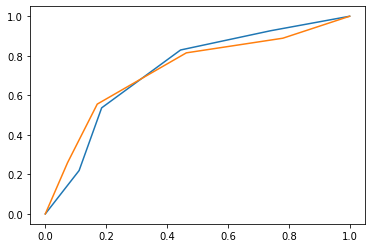

In [43]:
from sklearn.neighbors import KNeighborsClassifier

knn = MyAlgorithm(KNeighborsClassifier(), train_data, test_data)
knn.build_algorithm()
knn_accuracies = knn.get_accuracies()

In [44]:
knn_accuracies

[0.7777777777777778,
 0.6911764705882353,
 0.7352941176470589,
 0.6617647058823529,
 0.7205882352941176,
 0.7205882352941176]

### Bagging (GBT)

Drop NaN: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       1.00      1.00      1.00         6
           2       1.00      1.00      1.00         3

    accuracy                           1.00         9
   macro avg       1.00      1.00      1.00         9
weighted avg       1.00      1.00      1.00         9

Matrice de confusion: 


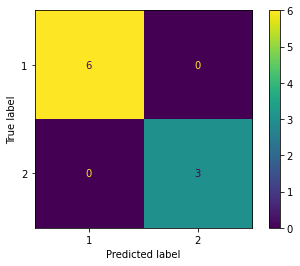

Courbes ROC


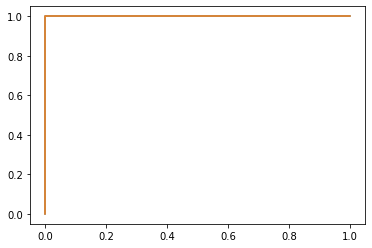

Mean: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.83      0.89      0.86        38
           2       0.85      0.77      0.81        30

    accuracy                           0.84        68
   macro avg       0.84      0.83      0.83        68
weighted avg       0.84      0.84      0.84        68

Matrice de confusion: 


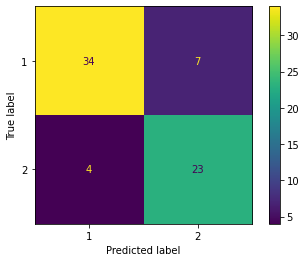

Courbes ROC


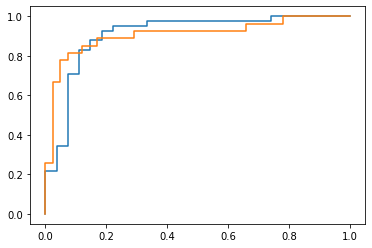

Median: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.83      0.87      0.85        39
           2       0.81      0.76      0.79        29

    accuracy                           0.82        68
   macro avg       0.82      0.82      0.82        68
weighted avg       0.82      0.82      0.82        68

Matrice de confusion: 


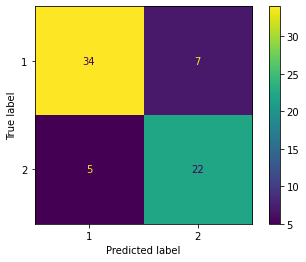

Courbes ROC


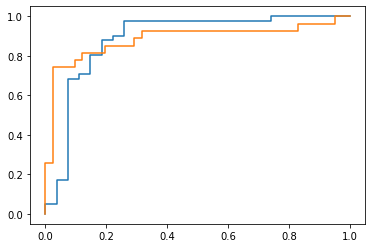

Neighbors: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.78      0.86      0.82        37
           2       0.81      0.71      0.76        31

    accuracy                           0.79        68
   macro avg       0.80      0.79      0.79        68
weighted avg       0.80      0.79      0.79        68

Matrice de confusion: 


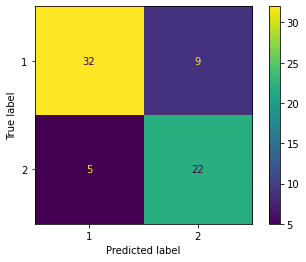

Courbes ROC


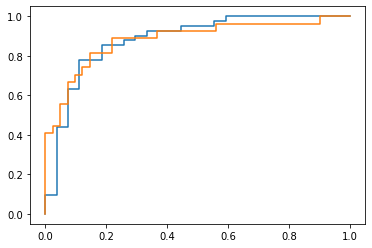

Linear Regression: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.85      0.88      0.86        40
           2       0.81      0.79      0.80        28

    accuracy                           0.84        68
   macro avg       0.83      0.83      0.83        68
weighted avg       0.84      0.84      0.84        68

Matrice de confusion: 


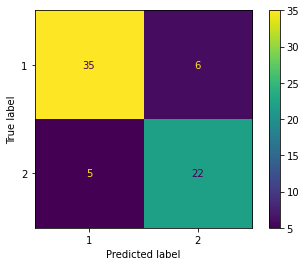

Courbes ROC


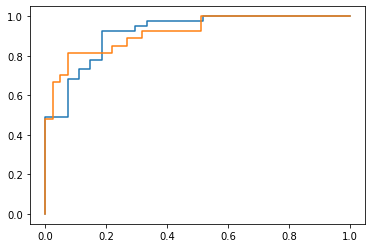

Mode: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.83      0.87      0.85        39
           2       0.81      0.76      0.79        29

    accuracy                           0.82        68
   macro avg       0.82      0.82      0.82        68
weighted avg       0.82      0.82      0.82        68

Matrice de confusion: 


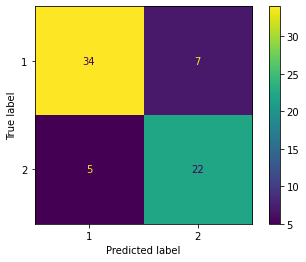

Courbes ROC


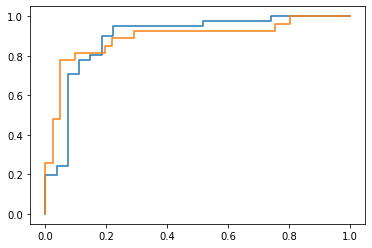

In [45]:
from sklearn.ensemble import GradientBoostingClassifier

gbt = MyAlgorithm(GradientBoostingClassifier(random_state=seed), train_data, test_data)
gbt.build_algorithm()
gbt_accuracies = gbt.get_accuracies()

In [46]:
gbt_accuracies

[1.0,
 0.8382352941176471,
 0.8235294117647058,
 0.7941176470588235,
 0.8382352941176471,
 0.8235294117647058]

### Ada Boost (Naive Bayes)

Drop NaN: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.83      1.00      0.91         5
           2       1.00      0.75      0.86         4

    accuracy                           0.89         9
   macro avg       0.92      0.88      0.88         9
weighted avg       0.91      0.89      0.89         9

Matrice de confusion: 


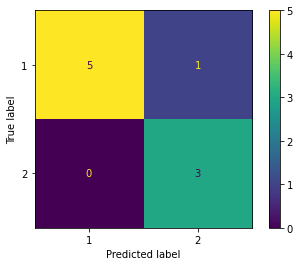

Courbes ROC


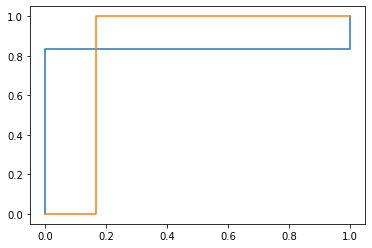

Mean: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.85      0.88      0.86        40
           2       0.81      0.79      0.80        28

    accuracy                           0.84        68
   macro avg       0.83      0.83      0.83        68
weighted avg       0.84      0.84      0.84        68

Matrice de confusion: 


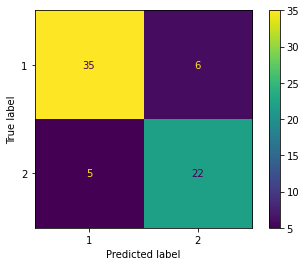

Courbes ROC


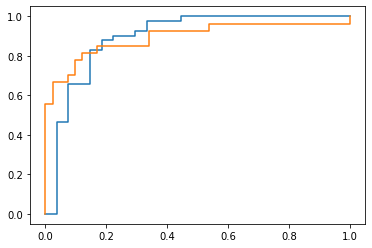

Median: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.88      0.88      0.88        41
           2       0.81      0.81      0.81        27

    accuracy                           0.85        68
   macro avg       0.85      0.85      0.85        68
weighted avg       0.85      0.85      0.85        68

Matrice de confusion: 


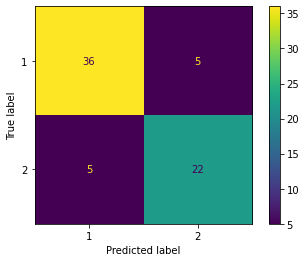

Courbes ROC


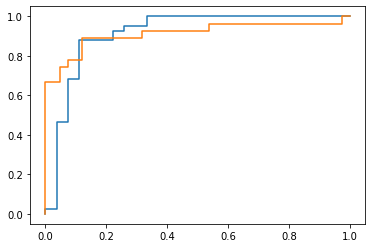

Neighbors: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.85      0.88      0.86        40
           2       0.81      0.79      0.80        28

    accuracy                           0.84        68
   macro avg       0.83      0.83      0.83        68
weighted avg       0.84      0.84      0.84        68

Matrice de confusion: 


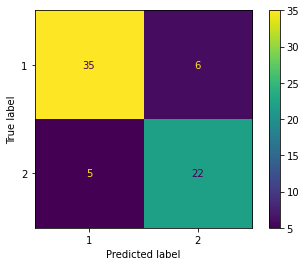

Courbes ROC


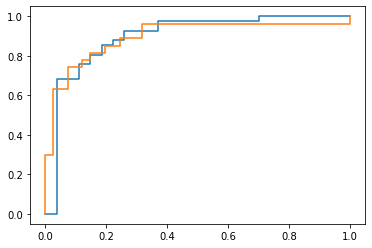

Linear Regression: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.88      0.84      0.86        43
           2       0.74      0.80      0.77        25

    accuracy                           0.82        68
   macro avg       0.81      0.82      0.81        68
weighted avg       0.83      0.82      0.82        68

Matrice de confusion: 


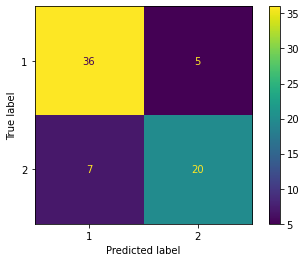

Courbes ROC


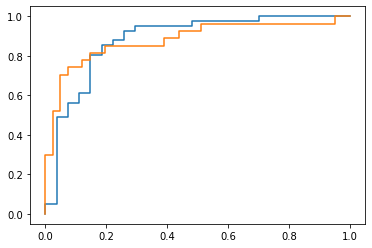

Mode: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.85      0.90      0.88        39
           2       0.85      0.79      0.82        29

    accuracy                           0.85        68
   macro avg       0.85      0.85      0.85        68
weighted avg       0.85      0.85      0.85        68

Matrice de confusion: 


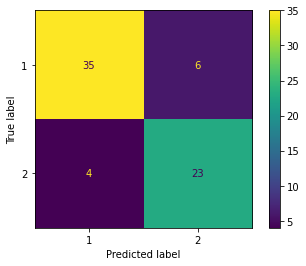

Courbes ROC


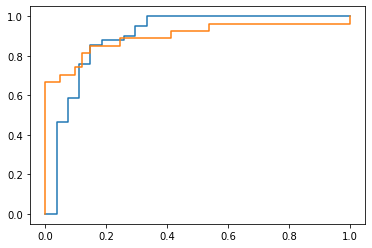

In [47]:
from sklearn.ensemble import AdaBoostClassifier

ada_boost = MyAlgorithm(AdaBoostClassifier(random_state=seed) , train_data, test_data)
ada_boost.build_algorithm()
ada_boost_accuracies = gbt.get_accuracies()

In [48]:
ada_boost_accuracies

[1.0,
 0.8382352941176471,
 0.8235294117647058,
 0.7941176470588235,
 0.8382352941176471,
 0.8235294117647058]

### Random Forest

Drop NaN: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       1.00      0.86      0.92         7
           2       0.67      1.00      0.80         2

    accuracy                           0.89         9
   macro avg       0.83      0.93      0.86         9
weighted avg       0.93      0.89      0.90         9

Matrice de confusion: 


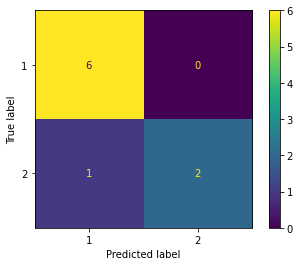

Courbes ROC


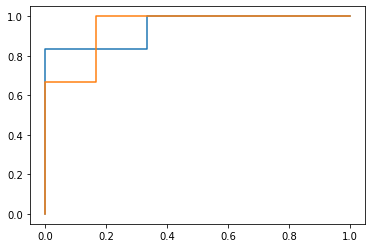

Mean: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.88      0.88      0.88        41
           2       0.81      0.81      0.81        27

    accuracy                           0.85        68
   macro avg       0.85      0.85      0.85        68
weighted avg       0.85      0.85      0.85        68

Matrice de confusion: 


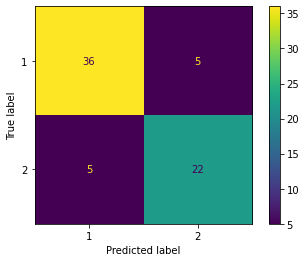

Courbes ROC


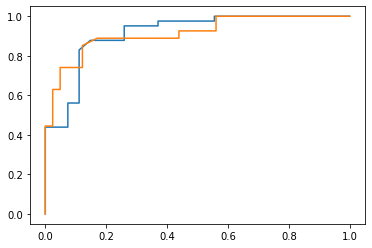

Median: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.80      0.89      0.85        37
           2       0.85      0.74      0.79        31

    accuracy                           0.82        68
   macro avg       0.83      0.82      0.82        68
weighted avg       0.83      0.82      0.82        68

Matrice de confusion: 


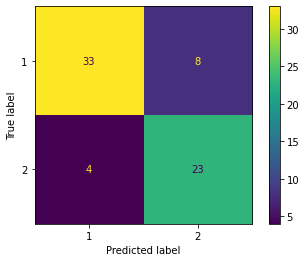

Courbes ROC


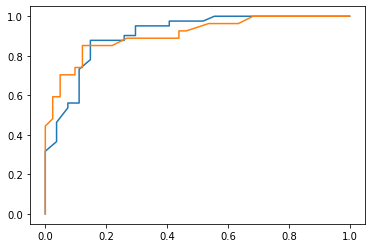

Neighbors: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.83      0.89      0.86        38
           2       0.85      0.77      0.81        30

    accuracy                           0.84        68
   macro avg       0.84      0.83      0.83        68
weighted avg       0.84      0.84      0.84        68

Matrice de confusion: 


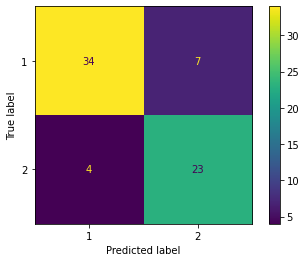

Courbes ROC


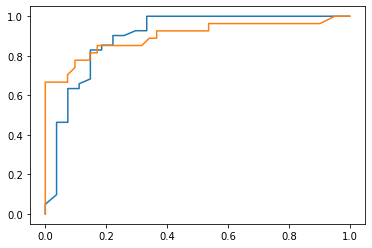

Linear Regression: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.88      0.88      0.88        41
           2       0.81      0.81      0.81        27

    accuracy                           0.85        68
   macro avg       0.85      0.85      0.85        68
weighted avg       0.85      0.85      0.85        68

Matrice de confusion: 


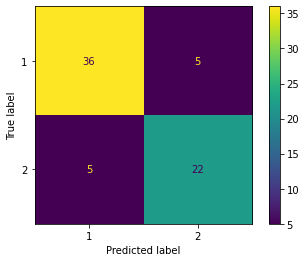

Courbes ROC


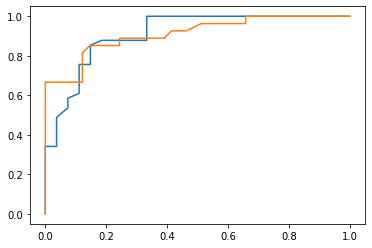

Mode: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.83      0.89      0.86        38
           2       0.85      0.77      0.81        30

    accuracy                           0.84        68
   macro avg       0.84      0.83      0.83        68
weighted avg       0.84      0.84      0.84        68

Matrice de confusion: 


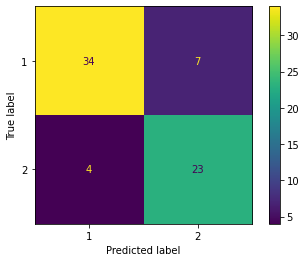

Courbes ROC


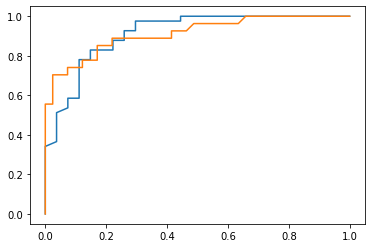

In [49]:
from sklearn.ensemble import RandomForestClassifier

random_forest = MyAlgorithm(RandomForestClassifier(random_state=seed), train_data, test_data)
random_forest.build_algorithm()
random_forest_accuracies = random_forest.get_accuracies()

In [50]:
random_forest_accuracies

[0.8888888888888888,
 0.8529411764705882,
 0.8235294117647058,
 0.8382352941176471,
 0.8529411764705882,
 0.8382352941176471]

In [51]:
all_accuracies = []
all_accuracies.append(nb_accuracies)
all_accuracies.append(lg_accuracies)
all_accuracies.append(decision_tree_accuracies)
all_accuracies.append(knn_accuracies)
all_accuracies.append(gbt_accuracies)
all_accuracies.append(ada_boost_accuracies)
all_accuracies.append(random_forest_accuracies)

In [52]:
all_accuracies[-1]

[0.8888888888888888,
 0.8529411764705882,
 0.8235294117647058,
 0.8382352941176471,
 0.8529411764705882,
 0.8382352941176471]

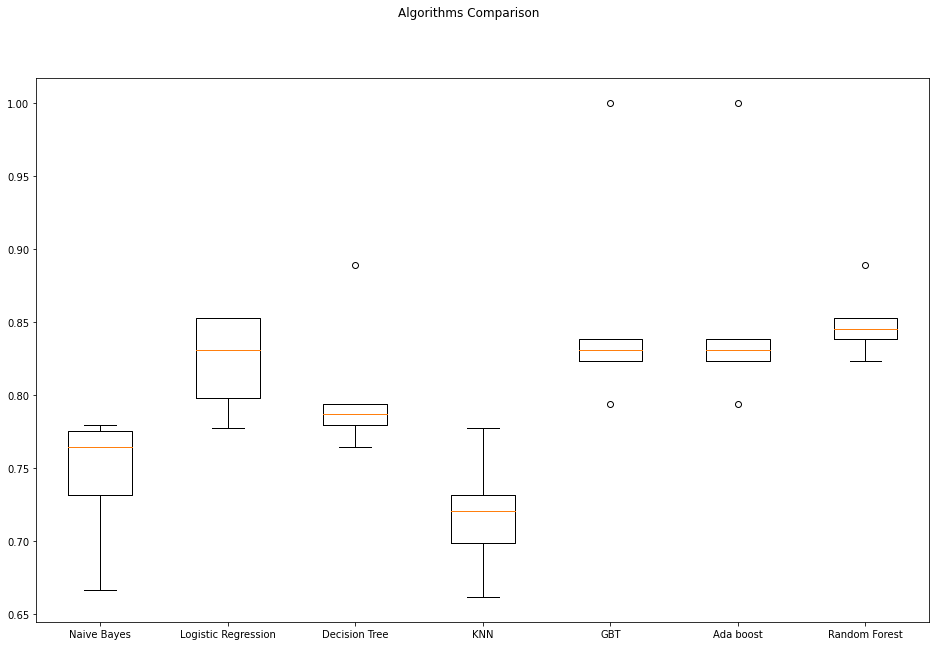

In [53]:
names = ["Naive Bayes", "Logistic Regression", "Decision Tree", "KNN", "GBT", "Ada boost", "Random Forest"]
fig = plt.figure(figsize=(16,10))
fig.suptitle('Algorithms Comparison')
ax = fig.add_subplot(111)
plt.boxplot(all_accuracies)
ax.set_xticklabels(names)
plt.show()

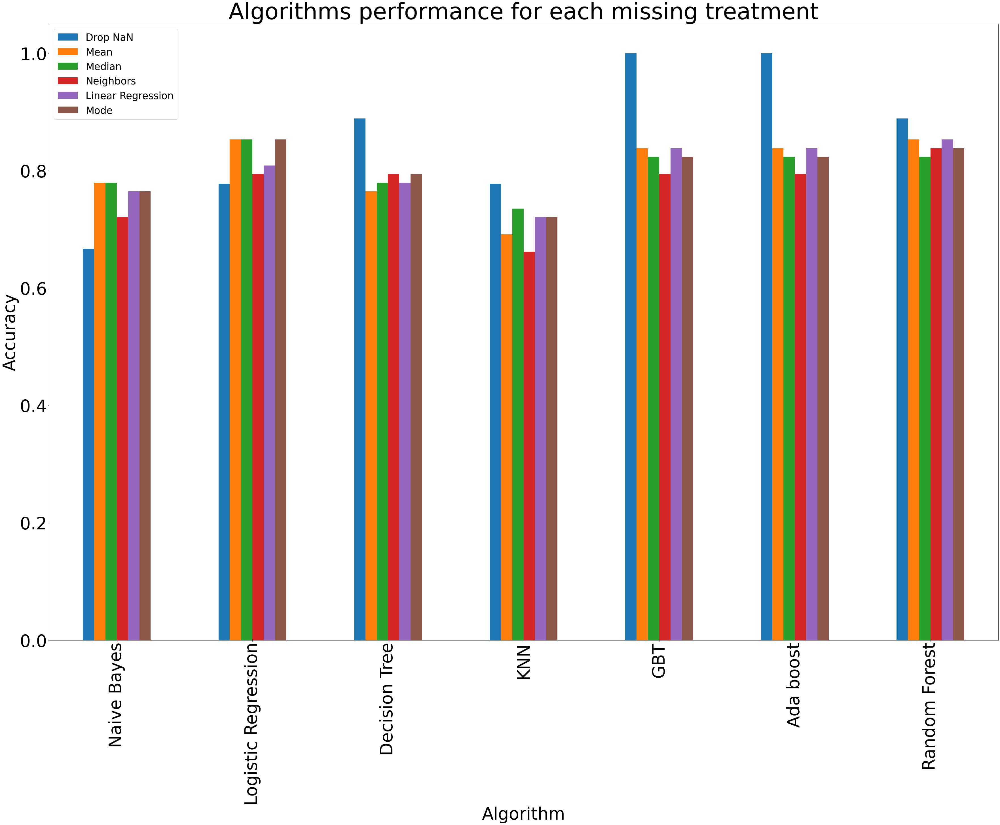

In [54]:
drop_nan_list = []
mean_list = []
median_list = []
neighbors_list = []
linear_reg_list = [] 
mode_list = []

for data in all_accuracies:
    drop_nan_list.append(data[0])
    mean_list.append(data[1])
    median_list.append(data[2])
    neighbors_list.append(data[3])
    linear_reg_list.append(data[4])
    mode_list.append(data[5])
    
plotdata = pd.DataFrame({
    "Drop NaN": drop_nan_list,
    "Mean": mean_list,
    "Median": median_list,
    "Neighbors": neighbors_list,
    "Linear Regression": linear_reg_list,
    "Mode": mode_list
    }, 
    index=["Naive Bayes", "Logistic Regression", "Decision Tree", "KNN", "GBT", "Ada boost", "Random Forest"]
)
my_plot = plotdata.plot(kind="bar", figsize=(60,40), fontsize=60)
plt.title("Algorithms performance for each missing treatment", fontsize=80)
plt.xlabel("Algorithm", fontsize=60)
plt.ylabel("Accuracy", fontsize=60)
my_plot.legend(fontsize=35)

In [55]:
plotdata

,Drop NaN,Mean,Median,Neighbors,Linear Regression,Mode
Naive Bayes,0.666667,0.779412,0.779412,0.720588,0.764706,0.764706
Logistic Regression,0.777778,0.852941,0.852941,0.794118,0.808824,0.852941
Decision Tree,0.888889,0.764706,0.779412,0.794118,0.779412,0.794118
KNN,0.777778,0.691176,0.735294,0.661765,0.720588,0.720588
GBT,1.000000,0.838235,0.823529,0.794118,0.838235,0.823529
Ada boost,1.000000,0.838235,0.823529,0.794118,0.838235,0.823529
Random Forest,0.888889,0.852941,0.823529,0.838235,0.852941,0.838235


Dans cette section je mesure la Precision = True Positives / (True Positives + False Positives), le Recall = True Positives / (True Positives + False Negatives), le F1 score = 2* ((Precision * Recall) / (Precision + Recall)) et la courbe ROC qui est une représentation graphique du taux de vrais positifs (en y) (True Positive Rate = True Positives / (True Positives + False Negatives)) par rapport au taux de faux positifs (en x) (False Positive Rate = False Positives / (False Positives + True Negatives)). Aussi, l'accuracy est calculée pour permettre de comparer le taux de prédictions similaires aux valeurs actuelles. La matrice de confusion nous permet de bien voir les nombres de vrais positifs, faux positifs, vrais négatifs et faux négatifs.

### - Quelle est la technique qui donne le meilleur résultat?

Dans mon cas, en regardant les graphiques et les tableaux représentant mes accuracies, je me suis aperçu que la technique de traitement où on laisse tomber les valeurs manquantes donne d'excellentes accuracies en général avec un score parfait à quelques reprises. Cependant, ces bons scores s'expliquent par le fait qu'après avoir laissé tomber toutes les lignes avec des données manquantes, il ne reste plus que 9 données sur lesquelles nous pouvons tester. Cela est un nombre très faible, ce qui fait en sorte que les scores obtenus ne sont pas significatifs. Alors, j'ai décidé d'ignorer cette technique puisqu'elle ne représente clairement pas la technique optimale pour cet ensemble de données, car il existe de nombreuses données manquantes. Par conséquent, en regardant les autres techniques, j'ai pu voir que ma technique de remplacement avec le mode des colonnes donnait de très bons résultats. 

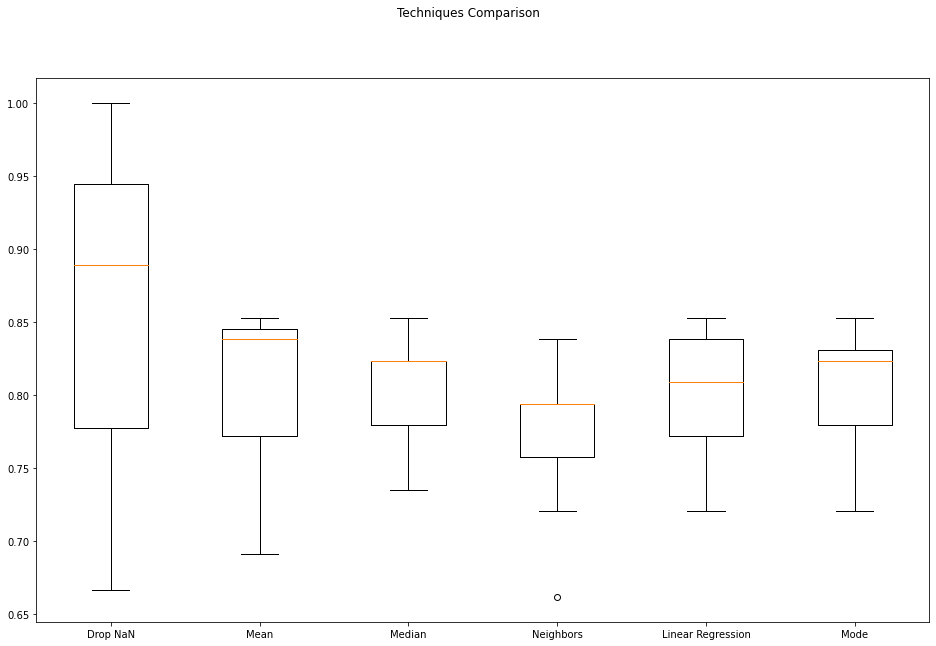

In [56]:
techniques_accuracies = []
techniques_accuracies.append(drop_nan_list)
techniques_accuracies.append(mean_list)
techniques_accuracies.append(median_list)
techniques_accuracies.append(neighbors_list)
techniques_accuracies.append(linear_reg_list)
techniques_accuracies.append(mode_list)

names = [
    "Drop NaN",
    "Mean",
    "Median",
    "Neighbors",
    "Linear Regression",
    "Mode"]
fig = plt.figure(figsize=(16,10))
fig.suptitle('Techniques Comparison')
ax = fig.add_subplot(111)
plt.boxplot(techniques_accuracies)
ax.set_xticklabels(names)
plt.show()

En effet, en regardant les boîtes à moustaches dans le graphique précédent, je peux clairement voir que mode a de plus bons résultats que les autres en ignorant la technique 1, soit de laisser tomber les valeurs manquantes. Avec mode, j'obtiens de très bonnes accuracies. Aussi, il est intéressant de voir que de manière générale, toutes les techniques de gestion des valeurs manquantes obtiennent des résultats plus proches que mon problème de classification sur le outcome. La seconde meilleure technique est celle de la médiane.

### - Quel est l'algorithme qui donne le meilleur résultat?


Mon meilleur algorithme est celui de Random Forest. En effet, en observant les boîtes à moustaches, je peux clairement voir qu'il obtient des résultats plus performants en ce qui concerne l'accuracy. Il est intéressant de voir que les deux autres algorithmes ensemblistes obtiennent aussi de bons résultats proches de ceux de Random Forest. Effectivement, GBT et Ada Boost obtiennent les mêmes résultats et sont proches des résultats de Random Forest. Il semblerait que ces deux modèles ont mieux performé quand la valeur target était binaire. Aussi, la régression logistique obtient de très bons scores aussi ce qui pourrait aussi être expliqué par la valeur target binaire.

## 7) Recherches les caractéristiques pertinentes

En analysant toutes mes métriques, j'ai conclu que mes deux meilleures techniques étaient la médiane et le mode. Il s'agit des dataframes aux emplacement 2 (Médiane) et 5 (Mode).

### Colonnes initiales

In [57]:
initial_columns_list = list(train_data[2][0].columns)
initial_columns_list

['surgery',
 'age',
 'rectal_temperature',
 'pulse',
 'respiratory_rate',
 'temperature_extremities',
 'peripheral_pulse',
 'mucous_membranes',
 'capillary_refill_time',
 'pain',
 'peristalsis',
 'abdominal_distension',
 'nasogastric_tube',
 'nasogastric_reflux',
 'feces',
 'abdomen',
 'packed_cell_volume',
 'total_protein',
 'outcome']

Puisque mon meilleur algorithme est celui de Random Forest, il sera utilisé pour la sélection de features importantes. 

In [58]:
from matplotlib import pyplot

def generate_feature_importance_plot(importance_scores):
    # Résumé des importances des attributs pour mon algorithme de Random Forest
    for i,v in enumerate(importance_scores):
        feature_name = initial_columns_list[i]
        print('Feature: %s, Score: %.5f' % (feature_name,v))
    # Plot des importances 
    pyplot.bar(initial_columns_list, importance_scores)
    plt.title("Score d'importance de chaque attribut")
    plt.xlabel("Attribut")
    plt.xticks(rotation=45, ha="right")
    plt.ylabel("Score d'importance")
    plt.figure(figsize= (200, 70))
    pyplot.show()

### Technique de la médiane

#### Approche 1

In [59]:
random_forest = RandomForestClassifier(random_state=seed)
random_forest.fit(train_data[2][0], train_data[2][1])
importance = random_forest.feature_importances_ 

Feature: surgery, Score: 0.23318
Feature: age, Score: 0.00619
Feature: rectal_temperature, Score: 0.04802
Feature: pulse, Score: 0.08902
Feature: respiratory_rate, Score: 0.05320
Feature: temperature_extremities, Score: 0.01834
Feature: peripheral_pulse, Score: 0.02618
Feature: mucous_membranes, Score: 0.04752
Feature: capillary_refill_time, Score: 0.00757
Feature: pain, Score: 0.05343
Feature: peristalsis, Score: 0.03960
Feature: abdominal_distension, Score: 0.04929
Feature: nasogastric_tube, Score: 0.01628
Feature: nasogastric_reflux, Score: 0.01926
Feature: feces, Score: 0.02308
Feature: abdomen, Score: 0.07010
Feature: packed_cell_volume, Score: 0.06297
Feature: total_protein, Score: 0.07268
Feature: outcome, Score: 0.06409


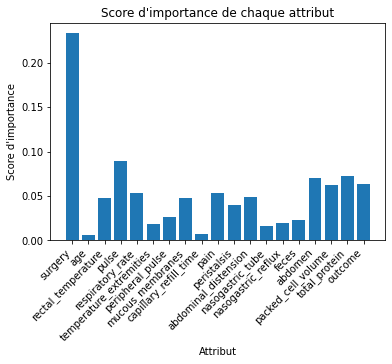

<Figure size 14400x5040 with 0 Axes>

In [60]:
generate_feature_importance_plot(importance)

In [61]:
# Je cherche les 6 meilleurs attributs
top_features_indices = importance.argsort()[-6:][::-1]
top_features_names = []
for i in top_features_indices:
    top_features_names.append(initial_columns_list[i])
    
top_features_names

['surgery',
 'pulse',
 'total_protein',
 'abdomen',
 'outcome',
 'packed_cell_volume']

#### Approche 2

In [62]:
from sklearn.feature_selection import SelectKBest, chi2

select_kbest = SelectKBest(chi2, k=6)
select_kbest.fit_transform(train_data[2][0], train_data[2][1])

array([[  2. ,  66. ,  28. ,   5. ,  45. ,   8.4],
       [  1. ,  88. ,  20. ,   3. ,  50. ,  85. ],
       [  2. ,  40. ,  24. ,   3. ,  33. ,   6.7],
       ...,
       [  1. ,  72. ,  30. ,   4. ,  60. ,   6.8],
       [  1. , 100. ,  24. ,   3. ,  50. ,   6. ],
       [  1. ,  40. ,  20. ,   3. ,  36. ,  62. ]])

Feature: surgery, Score: 18.86739
Feature: age, Score: 1.66362
Feature: rectal_temperature, Score: 0.00074
Feature: pulse, Score: 199.94969
Feature: respiratory_rate, Score: 100.47751
Feature: temperature_extremities, Score: 4.32573
Feature: peripheral_pulse, Score: 11.14072
Feature: mucous_membranes, Score: 12.80350
Feature: capillary_refill_time, Score: 1.08538
Feature: pain, Score: 19.71651
Feature: peristalsis, Score: 10.57470
Feature: abdominal_distension, Score: 12.94062
Feature: nasogastric_tube, Score: 0.00246
Feature: nasogastric_reflux, Score: 4.64100
Feature: feces, Score: 5.71461
Feature: abdomen, Score: 15.31084
Feature: packed_cell_volume, Score: 16.94826
Feature: total_protein, Score: 130.43383
Feature: outcome, Score: 4.47918


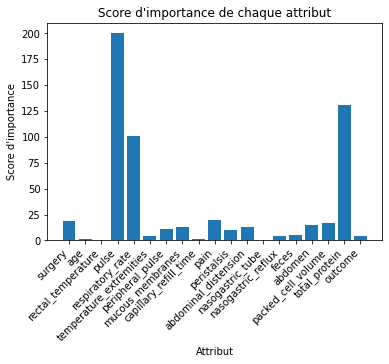

<Figure size 14400x5040 with 0 Axes>

In [63]:
generate_feature_importance_plot(select_kbest.scores_)

In [64]:
# Je cherche les 6 meilleurs attributs
top_features_indices = select_kbest.scores_.argsort()[-6:][::-1]
top_features_names = []
for i in top_features_indices:
    top_features_names.append(initial_columns_list[i])
    
top_features_names

['pulse',
 'total_protein',
 'respiratory_rate',
 'pain',
 'surgery',
 'packed_cell_volume']

### Technique du mode

In [65]:
random_forest = RandomForestClassifier(random_state=seed)
random_forest.fit(train_data[5][0], train_data[5][1])
importance = random_forest.feature_importances_ 

#### Approche 1

Feature: surgery, Score: 0.24477
Feature: age, Score: 0.00740
Feature: rectal_temperature, Score: 0.05222
Feature: pulse, Score: 0.07083
Feature: respiratory_rate, Score: 0.06204
Feature: temperature_extremities, Score: 0.02138
Feature: peripheral_pulse, Score: 0.02071
Feature: mucous_membranes, Score: 0.02804
Feature: capillary_refill_time, Score: 0.01074
Feature: pain, Score: 0.05655
Feature: peristalsis, Score: 0.04294
Feature: abdominal_distension, Score: 0.05904
Feature: nasogastric_tube, Score: 0.01493
Feature: nasogastric_reflux, Score: 0.01898
Feature: feces, Score: 0.01868
Feature: abdomen, Score: 0.07040
Feature: packed_cell_volume, Score: 0.06887
Feature: total_protein, Score: 0.06995
Feature: outcome, Score: 0.06154


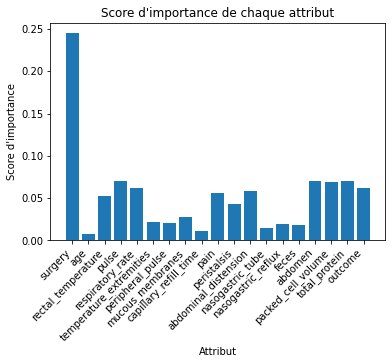

<Figure size 14400x5040 with 0 Axes>

In [66]:
generate_feature_importance_plot(importance)

In [67]:
# Je cherche les 6 meilleurs attributs
top_features_indices = importance.argsort()[-6:][::-1]
top_features_names = []
for i in top_features_indices:
    top_features_names.append(initial_columns_list[i])
    
top_features_names

['surgery',
 'pulse',
 'abdomen',
 'total_protein',
 'packed_cell_volume',
 'respiratory_rate']

#### Approche 2

In [68]:
from sklearn.feature_selection import SelectKBest, chi2

select_kbest = SelectKBest(chi2, k=6)
select_kbest.fit_transform(train_data[5][0], train_data[5][1])

array([[  2. ,  66. ,  28. ,   5. ,  45. ,   8.4],
       [  1. ,  88. ,  20. ,   3. ,  50. ,  85. ],
       [  2. ,  40. ,  24. ,   3. ,  33. ,   6.7],
       ...,
       [  1. ,  72. ,  30. ,   4. ,  60. ,   6.8],
       [  1. , 100. ,  24. ,   3. ,  50. ,   6. ],
       [  1. ,  40. ,  20. ,   3. ,  36. ,  62. ]])

Feature: surgery, Score: 18.86739
Feature: age, Score: 1.66362
Feature: rectal_temperature, Score: 0.00377
Feature: pulse, Score: 186.17630
Feature: respiratory_rate, Score: 89.47770
Feature: temperature_extremities, Score: 4.32573
Feature: peripheral_pulse, Score: 12.53296
Feature: mucous_membranes, Score: 10.10779
Feature: capillary_refill_time, Score: 1.08538
Feature: pain, Score: 19.71651
Feature: peristalsis, Score: 10.57470
Feature: abdominal_distension, Score: 15.86122
Feature: nasogastric_tube, Score: 0.00246
Feature: nasogastric_reflux, Score: 4.64100
Feature: feces, Score: 5.12188
Feature: abdomen, Score: 12.13798
Feature: packed_cell_volume, Score: 17.78969
Feature: total_protein, Score: 132.81105
Feature: outcome, Score: 4.47918


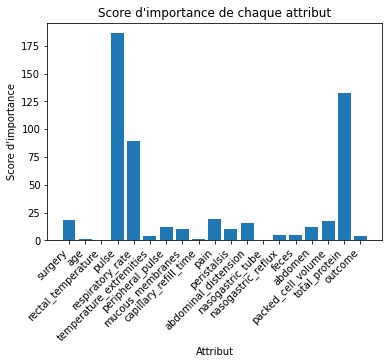

<Figure size 14400x5040 with 0 Axes>

In [69]:
generate_feature_importance_plot(select_kbest.scores_)

In [70]:
# Je cherche les 6 meilleurs attributs
top_features_indices = select_kbest.scores_.argsort()[-6:][::-1]
top_features_names = []
for i in top_features_indices:
    top_features_names.append(initial_columns_list[i])
    
top_features_names

['pulse',
 'total_protein',
 'respiratory_rate',
 'pain',
 'surgery',
 'packed_cell_volume']

Pour les deux techniques, en utilisant les deux approches j'obtiens environ les mêmes résultats. Pour la médiane et l'approche 1, je peux voir l'attribut outcome se glisse. Cependant, dans toutes les autres approches et techniques il n'a pas été présent, alors je vais l'ignorer. En effet, pour la sélection de features de sklearn en retirant les scores d'importance avec feature_importances_ j'obtiens 'surgery','pulse','abdomen','total_protein','packed_cell_volume' et 'respiratory_rate'. Cependant pour la seconde approche, soit celle SelectKBest, j'obtiens 'pulse', 'total_protein', 'respiratory_rate', 'pain', 'surgery' et'packed_cell_volume'. Il s'agit d'environ les mêmes attributs que mon autre problème de classification.  Dans ce cas, nous pouvons voir que les features différentes dans les deux approches sont abdomen (Approche 1) et pain  (Approche 2). Les cinq autres features sont communes aux deux approches, alors celles-ci seront préservées. Il s'agit de 'total_protein','pulse','packed_cell_volume', 'surgery' et 'respiratory_rate'.

Alors, en relisant la documentation et en effectuant quelques recherches, j'ai décidé d'ignorer 'respiratory_rate puisqu'il était indiqué: usefulness is doubtful due to the great fluctuations. Aussi, en lisant la documentation, j'ai pu remarquer que l'attribut abdominal distension a une note indiquant qu'il s'agit d'un attribut important. Alors, j'ai décidé de l'ajouter à ma liste de features importantes, même s'il ne se trouve pas dans le top 6. Il ne me reste qu'à décider entre pain et abdomen. En relisant la documentation, j'ai pu voir que pain était une valeur subjective ce qui fait en sorte que la certitude de sa valeur est dépendante d'une analyse humaine. Cela peut causer des incertitudes d'où la raison pourquoi, j'ai décidé de l'ignorer.

Mes features finales sont: 'total_protein','pulse','packed_cell_volume', 'surgery', 'abdomen' et 'abdominal_distension'.

## 8) On recommence le tout

In [71]:
important_features = ['surgical_lesion','total_protein','pulse','packed_cell_volume', 'surgery', 'abdomen', 'abdominal_distension']

In [72]:
new_train_df = df_train_drop[important_features]
new_test_df = df_test_drop[important_features]

In [73]:
new_train_df

,surgical_lesion,total_protein,pulse,packed_cell_volume,surgery,abdomen,abdominal_distension
0,2,8.4,66.0,45.0,2.0,5.0,4.0
1,2,85.0,88.0,50.0,1.0,2.0,2.0
2,2,6.7,40.0,33.0,2.0,1.0,1.0
3,1,7.2,164.0,48.0,1.0,NaN,4.0
4,2,7.4,104.0,74.0,2.0,NaN,NaN
...,...,...,...,...,...,...,...
295,2,65.0,120.0,55.0,1.0,5.0,NaN
296,1,NaN,72.0,44.0,2.0,4.0,3.0
297,1,6.8,72.0,60.0,1.0,5.0,3.0
298,1,6.0,100.0,50.0,1.0,4.0,3.0


### Le traitement des données manquantes

In [74]:
new_treat = TreatMissing(new_train_df, new_test_df)

In [75]:
new_treat.train_dfs

[]

#### a) On laisse tomber toutes les valeurs manquantes: on retire du jeu de données toutes les lignes qui ont une valeur manquante

In [76]:
new_treat.apply_treatment()

In [77]:
new_treat.train_dfs[0]

,surgical_lesion,total_protein,pulse,packed_cell_volume,surgery,abdomen,abdominal_distension
0,2,8.4,66.0,45.0,2.0,5.0,4.0
1,2,85.0,88.0,50.0,1.0,2.0,2.0
2,2,6.7,40.0,33.0,2.0,1.0,1.0
6,1,7.0,48.0,37.0,1.0,5.0,3.0
7,1,8.3,60.0,44.0,1.0,4.0,2.0
...,...,...,...,...,...,...,...
291,1,6.5,80.0,54.0,1.0,1.0,3.0
292,1,6.9,66.0,35.0,1.0,5.0,3.0
294,2,67.0,40.0,37.0,2.0,2.0,1.0
297,1,6.8,72.0,60.0,1.0,5.0,3.0


#### b) On remplace les données manquantes par la moyenne de leur groupe

In [78]:
from sklearn.impute import SimpleImputer

imp_mean = SimpleImputer(missing_values=np.nan, strategy='mean')
new_treat.apply_treatment(imputer=imp_mean)

#### c) On remplace les données manquantes par la médiane de leur groupe

In [79]:
imp_median = SimpleImputer(missing_values=np.nan, strategy='median')
new_treat.apply_treatment(imputer=imp_median)

#### d) On utilise les voisins immédiats pour trouver la bonne valeur

In [80]:
from sklearn.impute import KNNImputer

imputer = KNNImputer(n_neighbors=2, weights="uniform")
new_treat.apply_treatment(imputer=imputer)

#### e) On utilise la régression linéaire pour trouver la bonne valeur

In [82]:
from sklearn.impute._iterative import IterativeImputer

lin_reg_imputer = IterativeImputer(estimator=LinearRegression(), random_state=seed)
new_treat.apply_treatment(imputer=lin_reg_imputer)

#### e) Ma technique: On remplace par le mode, soit la donnée la plus fréquente de la colonne

In [83]:
imp_mode = SimpleImputer(missing_values=np.nan, strategy='most_frequent')
new_treat.apply_treatment(imputer=imp_mode)

### L'apprentissage automatique et analyse des résultats


### Séparation des attributs du target

In [84]:
train_data = []
test_data = []

for (train, test) in zip(new_treat.train_dfs, new_treat.test_dfs):
    y_train = train["surgical_lesion"]
    X_train = train.drop(["surgical_lesion"], axis=1)
    y_test = test["surgical_lesion"]
    X_test = test.drop(["surgical_lesion"], axis=1)
    train_data.append((X_train, y_train.astype(int)))
    test_data.append((X_test, y_test.astype(int)))

#### Naive Bayes

Drop NaN: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.95      0.95      0.95        20
           2       0.93      0.93      0.93        14

    accuracy                           0.94        34
   macro avg       0.94      0.94      0.94        34
weighted avg       0.94      0.94      0.94        34

Matrice de confusion: 


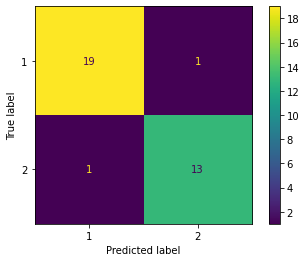

Courbes ROC


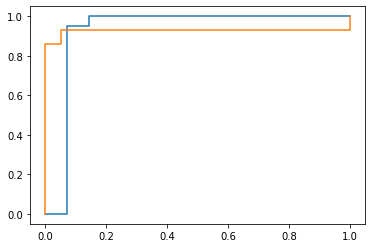

Mean: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.78      0.91      0.84        35
           2       0.89      0.73      0.80        33

    accuracy                           0.82        68
   macro avg       0.83      0.82      0.82        68
weighted avg       0.83      0.82      0.82        68

Matrice de confusion: 


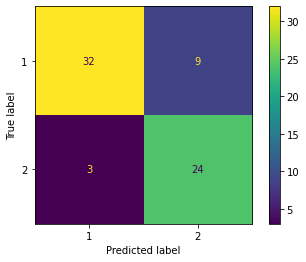

Courbes ROC


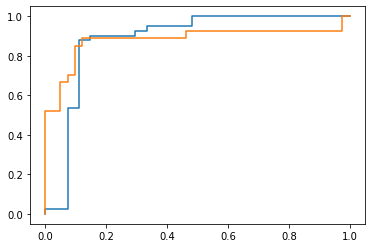

Median: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.78      0.91      0.84        35
           2       0.89      0.73      0.80        33

    accuracy                           0.82        68
   macro avg       0.83      0.82      0.82        68
weighted avg       0.83      0.82      0.82        68

Matrice de confusion: 


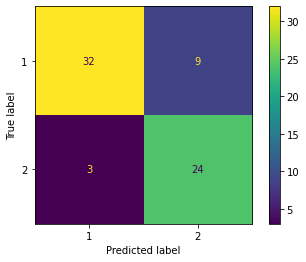

Courbes ROC


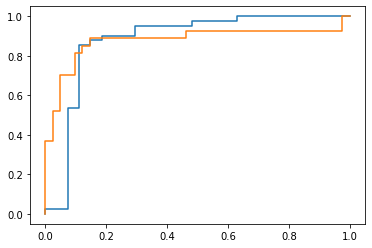

Neighbors: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.76      0.91      0.83        34
           2       0.89      0.71      0.79        34

    accuracy                           0.81        68
   macro avg       0.82      0.81      0.81        68
weighted avg       0.82      0.81      0.81        68

Matrice de confusion: 


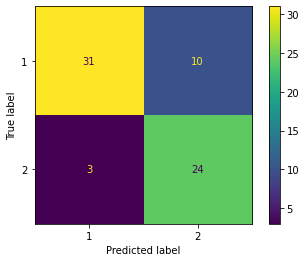

Courbes ROC


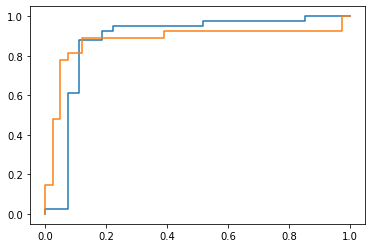

Linear Regression: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.83      0.92      0.87        37
           2       0.89      0.77      0.83        31

    accuracy                           0.85        68
   macro avg       0.86      0.85      0.85        68
weighted avg       0.86      0.85      0.85        68

Matrice de confusion: 


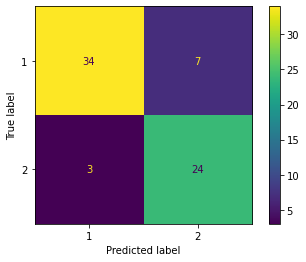

Courbes ROC


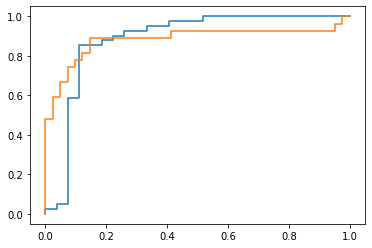

Mode: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.78      0.91      0.84        35
           2       0.89      0.73      0.80        33

    accuracy                           0.82        68
   macro avg       0.83      0.82      0.82        68
weighted avg       0.83      0.82      0.82        68

Matrice de confusion: 


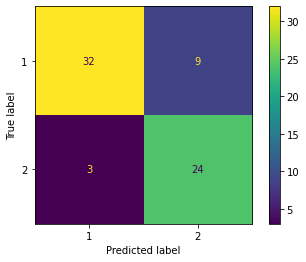

Courbes ROC


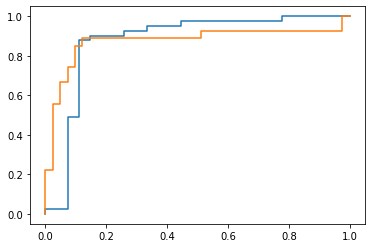

In [85]:
from sklearn.naive_bayes import GaussianNB

naive_bayes = MyAlgorithm(GaussianNB(), train_data, test_data)
naive_bayes.build_algorithm()
nb_accuracies = naive_bayes.get_accuracies()

#### Régression Logistique

Drop NaN: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       1.00      0.91      0.95        22
           2       0.86      1.00      0.92        12

    accuracy                           0.94        34
   macro avg       0.93      0.95      0.94        34
weighted avg       0.95      0.94      0.94        34

Matrice de confusion: 


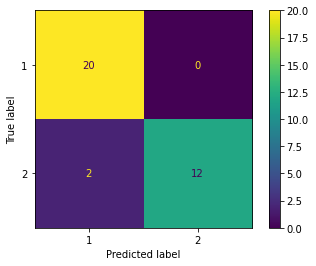

Courbes ROC


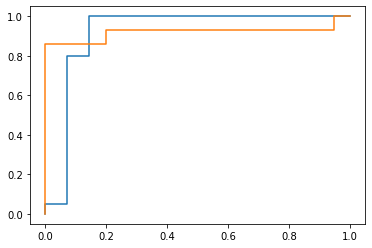

Mean: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.85      0.92      0.89        38
           2       0.89      0.80      0.84        30

    accuracy                           0.87        68
   macro avg       0.87      0.86      0.86        68
weighted avg       0.87      0.87      0.87        68

Matrice de confusion: 


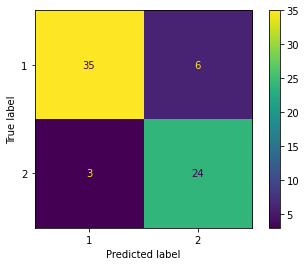

Courbes ROC


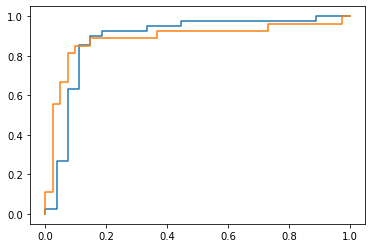

Median: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.83      0.92      0.87        37
           2       0.89      0.77      0.83        31

    accuracy                           0.85        68
   macro avg       0.86      0.85      0.85        68
weighted avg       0.86      0.85      0.85        68

Matrice de confusion: 


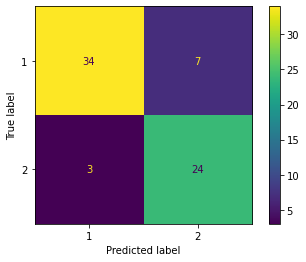

Courbes ROC


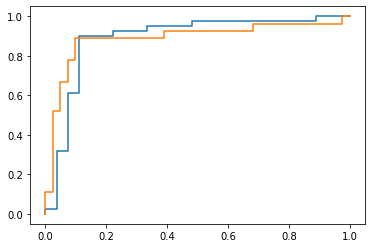

Neighbors: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.80      0.92      0.86        36
           2       0.89      0.75      0.81        32

    accuracy                           0.84        68
   macro avg       0.85      0.83      0.84        68
weighted avg       0.84      0.84      0.84        68

Matrice de confusion: 


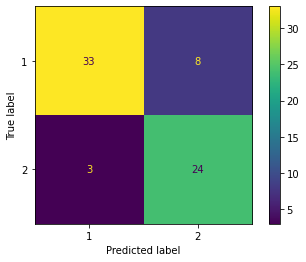

Courbes ROC


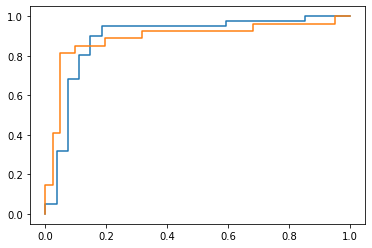

Linear Regression: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.88      0.88      0.88        41
           2       0.81      0.81      0.81        27

    accuracy                           0.85        68
   macro avg       0.85      0.85      0.85        68
weighted avg       0.85      0.85      0.85        68

Matrice de confusion: 


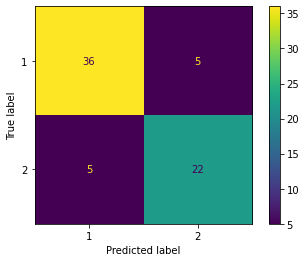

Courbes ROC


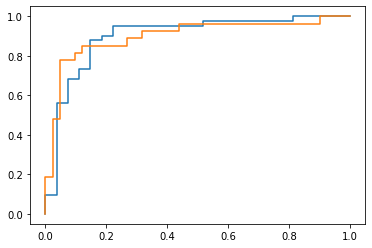

Mode: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.83      0.92      0.87        37
           2       0.89      0.77      0.83        31

    accuracy                           0.85        68
   macro avg       0.86      0.85      0.85        68
weighted avg       0.86      0.85      0.85        68

Matrice de confusion: 


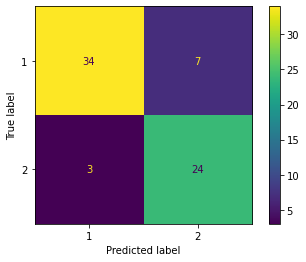

Courbes ROC


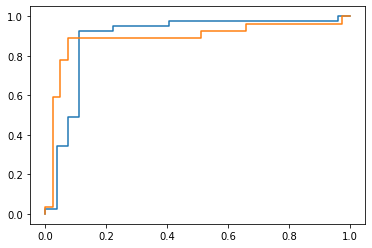

In [86]:
from sklearn.linear_model import LogisticRegression

logistic_regression = MyAlgorithm(LogisticRegression(random_state=seed) , train_data, test_data)
logistic_regression.build_algorithm()
lg_accuracies = logistic_regression.get_accuracies()

#### Decision Tree

Drop NaN: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.90      0.82      0.86        22
           2       0.71      0.83      0.77        12

    accuracy                           0.82        34
   macro avg       0.81      0.83      0.81        34
weighted avg       0.83      0.82      0.83        34

Matrice de confusion: 


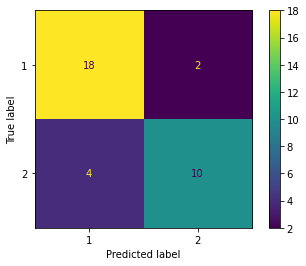

Courbes ROC


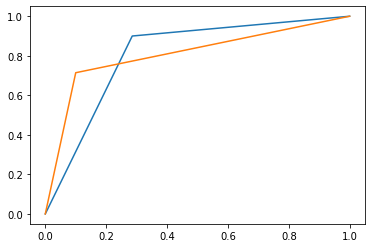

Mean: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.80      0.77      0.79        43
           2       0.63      0.68      0.65        25

    accuracy                           0.74        68
   macro avg       0.72      0.72      0.72        68
weighted avg       0.74      0.74      0.74        68

Matrice de confusion: 


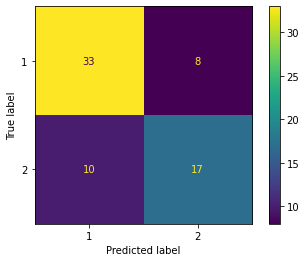

Courbes ROC


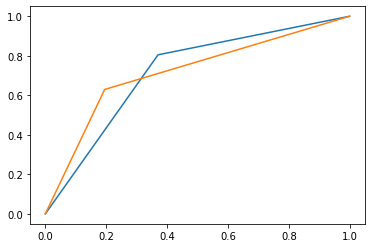

Median: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.85      0.83      0.84        42
           2       0.74      0.77      0.75        26

    accuracy                           0.81        68
   macro avg       0.80      0.80      0.80        68
weighted avg       0.81      0.81      0.81        68

Matrice de confusion: 


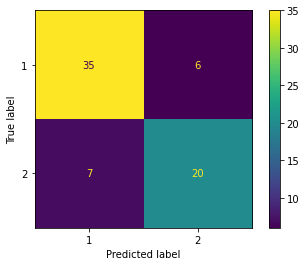

Courbes ROC


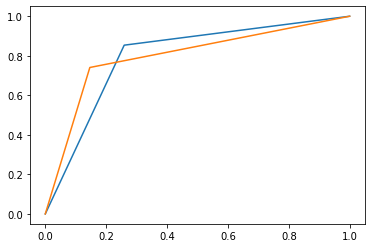

Neighbors: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.90      0.88      0.89        42
           2       0.81      0.85      0.83        26

    accuracy                           0.87        68
   macro avg       0.86      0.86      0.86        68
weighted avg       0.87      0.87      0.87        68

Matrice de confusion: 


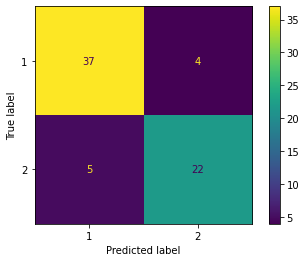

Courbes ROC


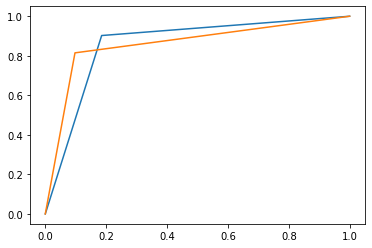

Linear Regression: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.93      0.79      0.85        48
           2       0.63      0.85      0.72        20

    accuracy                           0.81        68
   macro avg       0.78      0.82      0.79        68
weighted avg       0.84      0.81      0.82        68

Matrice de confusion: 


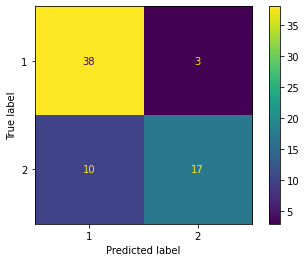

Courbes ROC


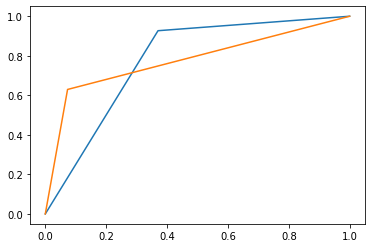

Mode: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.83      0.85      0.84        40
           2       0.78      0.75      0.76        28

    accuracy                           0.81        68
   macro avg       0.80      0.80      0.80        68
weighted avg       0.81      0.81      0.81        68

Matrice de confusion: 


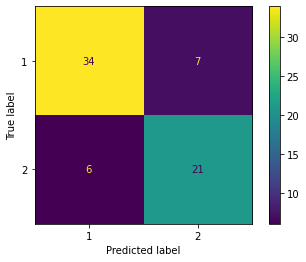

Courbes ROC


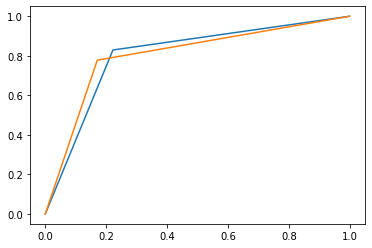

In [87]:
from sklearn.tree import DecisionTreeClassifier

decision_tree = MyAlgorithm(DecisionTreeClassifier(random_state=seed) , train_data, test_data)
decision_tree.build_algorithm()
decision_tree_accuracies = decision_tree.get_accuracies()

#### KNN

Drop NaN: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.80      0.70      0.74        23
           2       0.50      0.64      0.56        11

    accuracy                           0.68        34
   macro avg       0.65      0.67      0.65        34
weighted avg       0.70      0.68      0.68        34

Matrice de confusion: 


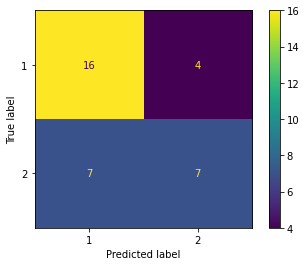

Courbes ROC


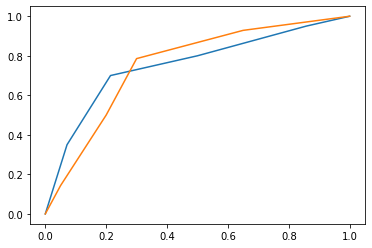

Mean: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.83      0.83      0.83        41
           2       0.74      0.74      0.74        27

    accuracy                           0.79        68
   macro avg       0.79      0.79      0.79        68
weighted avg       0.79      0.79      0.79        68

Matrice de confusion: 


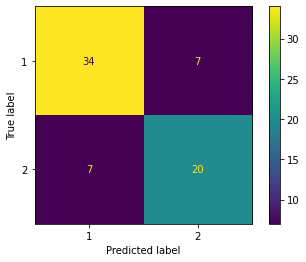

Courbes ROC


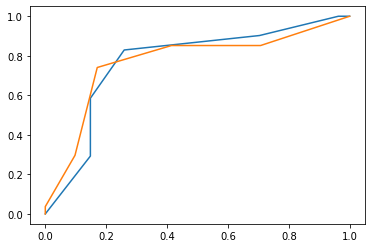

Median: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.71      0.78      0.74        37
           2       0.70      0.61      0.66        31

    accuracy                           0.71        68
   macro avg       0.71      0.70      0.70        68
weighted avg       0.71      0.71      0.70        68

Matrice de confusion: 


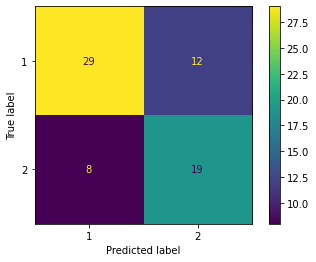

Courbes ROC


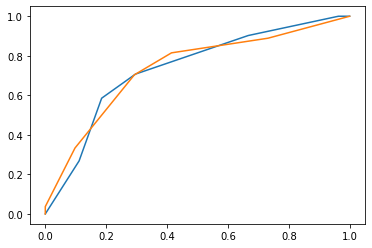

Neighbors: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.76      0.78      0.77        40
           2       0.67      0.64      0.65        28

    accuracy                           0.72        68
   macro avg       0.71      0.71      0.71        68
weighted avg       0.72      0.72      0.72        68

Matrice de confusion: 


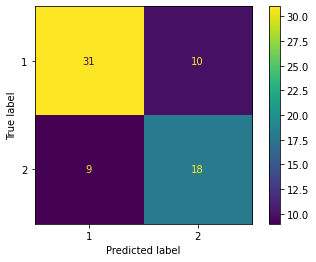

Courbes ROC


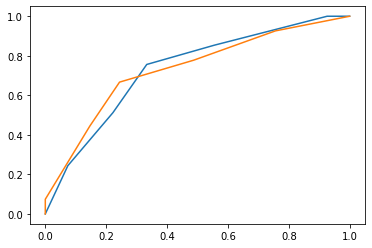

Linear Regression: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.83      0.83      0.83        41
           2       0.74      0.74      0.74        27

    accuracy                           0.79        68
   macro avg       0.79      0.79      0.79        68
weighted avg       0.79      0.79      0.79        68

Matrice de confusion: 


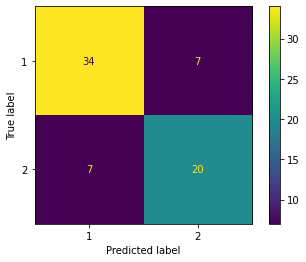

Courbes ROC


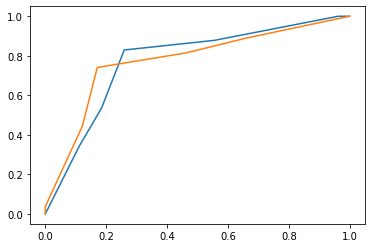

Mode: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.83      0.77      0.80        44
           2       0.63      0.71      0.67        24

    accuracy                           0.75        68
   macro avg       0.73      0.74      0.73        68
weighted avg       0.76      0.75      0.75        68

Matrice de confusion: 


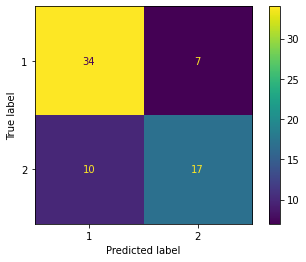

Courbes ROC


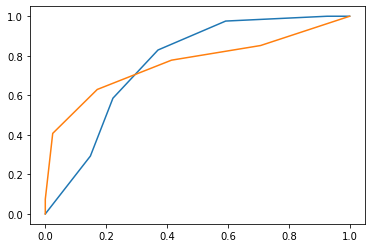

In [88]:
from sklearn.neighbors import KNeighborsClassifier

knn = MyAlgorithm(KNeighborsClassifier(), train_data, test_data)
knn.build_algorithm()
knn_accuracies = knn.get_accuracies()

#### Bagging (GBT)

Drop NaN: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.90      0.86      0.88        21
           2       0.79      0.85      0.81        13

    accuracy                           0.85        34
   macro avg       0.84      0.85      0.85        34
weighted avg       0.86      0.85      0.85        34

Matrice de confusion: 


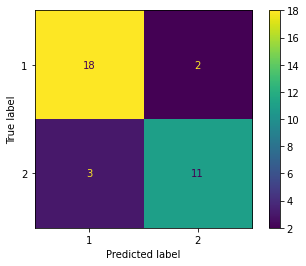

Courbes ROC


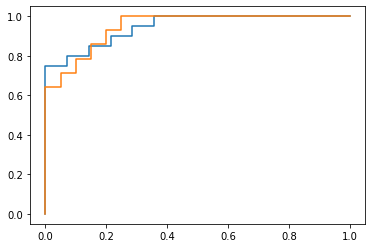

Mean: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.85      0.88      0.86        40
           2       0.81      0.79      0.80        28

    accuracy                           0.84        68
   macro avg       0.83      0.83      0.83        68
weighted avg       0.84      0.84      0.84        68

Matrice de confusion: 


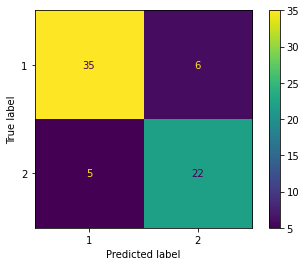

Courbes ROC


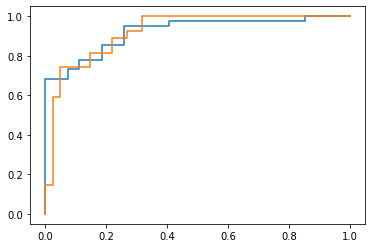

Median: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.88      0.90      0.89        40
           2       0.85      0.82      0.84        28

    accuracy                           0.87        68
   macro avg       0.86      0.86      0.86        68
weighted avg       0.87      0.87      0.87        68

Matrice de confusion: 


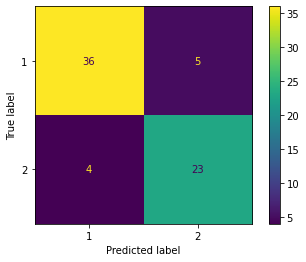

Courbes ROC


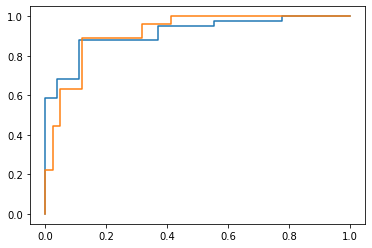

Neighbors: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.85      0.85      0.85        41
           2       0.78      0.78      0.78        27

    accuracy                           0.82        68
   macro avg       0.82      0.82      0.82        68
weighted avg       0.82      0.82      0.82        68

Matrice de confusion: 


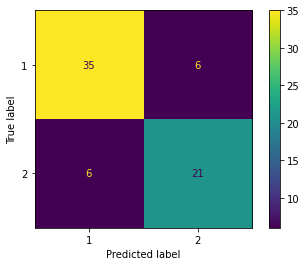

Courbes ROC


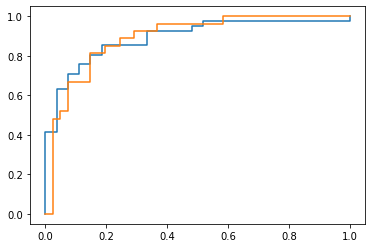

Linear Regression: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.85      0.85      0.85        41
           2       0.78      0.78      0.78        27

    accuracy                           0.82        68
   macro avg       0.82      0.82      0.82        68
weighted avg       0.82      0.82      0.82        68

Matrice de confusion: 


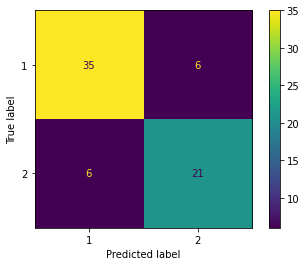

Courbes ROC


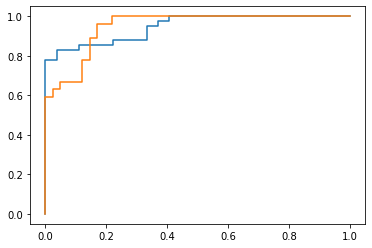

Mode: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.88      0.88      0.88        41
           2       0.81      0.81      0.81        27

    accuracy                           0.85        68
   macro avg       0.85      0.85      0.85        68
weighted avg       0.85      0.85      0.85        68

Matrice de confusion: 


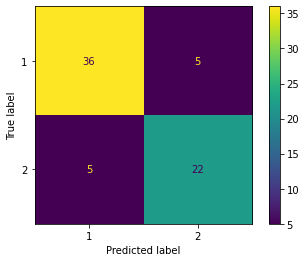

Courbes ROC


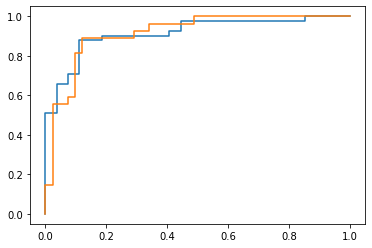

In [89]:
from sklearn.ensemble import GradientBoostingClassifier

gbt = MyAlgorithm(GradientBoostingClassifier(random_state=seed), train_data, test_data)
gbt.build_algorithm()
gbt_accuracies = gbt.get_accuracies()

#### Ada Boost (Naive Bayes)

Drop NaN: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       1.00      0.87      0.93        23
           2       0.79      1.00      0.88        11

    accuracy                           0.91        34
   macro avg       0.89      0.93      0.91        34
weighted avg       0.93      0.91      0.91        34

Matrice de confusion: 


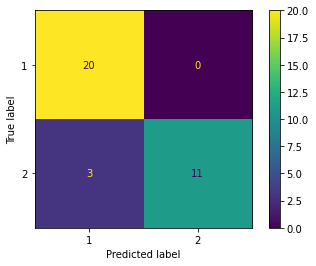

Courbes ROC


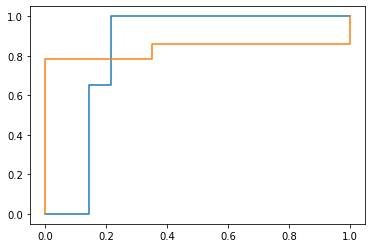

Mean: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.88      0.88      0.88        41
           2       0.81      0.81      0.81        27

    accuracy                           0.85        68
   macro avg       0.85      0.85      0.85        68
weighted avg       0.85      0.85      0.85        68

Matrice de confusion: 


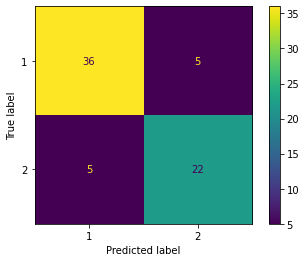

Courbes ROC


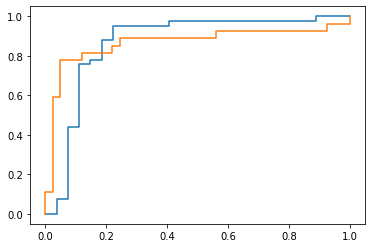

Median: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.88      0.86      0.87        42
           2       0.78      0.81      0.79        26

    accuracy                           0.84        68
   macro avg       0.83      0.83      0.83        68
weighted avg       0.84      0.84      0.84        68

Matrice de confusion: 


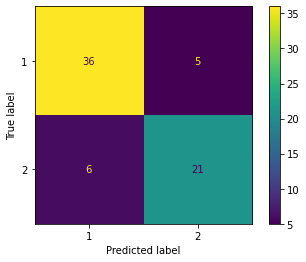

Courbes ROC


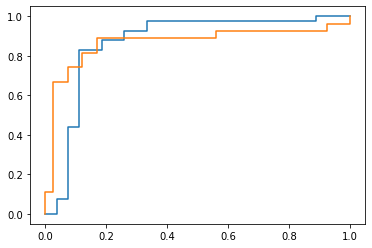

Neighbors: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.83      0.89      0.86        38
           2       0.85      0.77      0.81        30

    accuracy                           0.84        68
   macro avg       0.84      0.83      0.83        68
weighted avg       0.84      0.84      0.84        68

Matrice de confusion: 


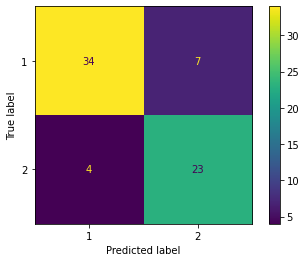

Courbes ROC


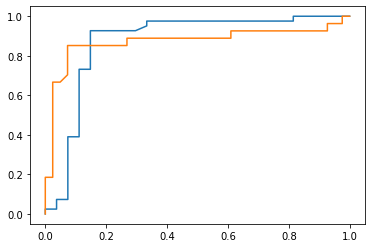

Linear Regression: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.95      0.87      0.91        45
           2       0.78      0.91      0.84        23

    accuracy                           0.88        68
   macro avg       0.86      0.89      0.87        68
weighted avg       0.89      0.88      0.88        68

Matrice de confusion: 


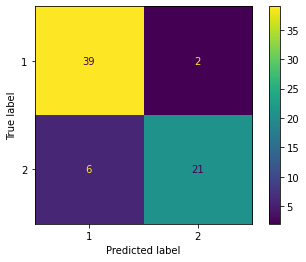

Courbes ROC


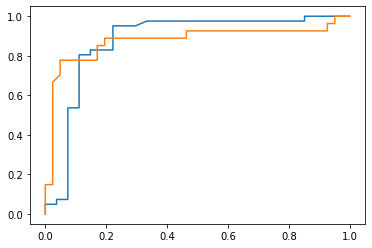

Mode: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.83      0.89      0.86        38
           2       0.85      0.77      0.81        30

    accuracy                           0.84        68
   macro avg       0.84      0.83      0.83        68
weighted avg       0.84      0.84      0.84        68

Matrice de confusion: 


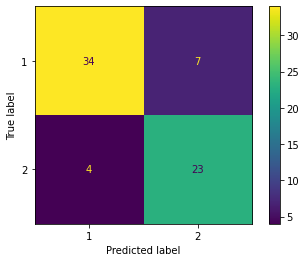

Courbes ROC


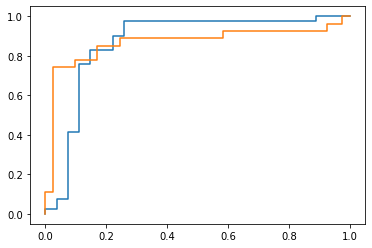

In [90]:
from sklearn.ensemble import AdaBoostClassifier

ada_boost = MyAlgorithm(AdaBoostClassifier(random_state=seed) , train_data, test_data)
ada_boost.build_algorithm()
ada_boost_accuracies = gbt.get_accuracies()

#### Random Forest

Drop NaN: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       1.00      0.83      0.91        24
           2       0.71      1.00      0.83        10

    accuracy                           0.88        34
   macro avg       0.86      0.92      0.87        34
weighted avg       0.92      0.88      0.89        34

Matrice de confusion: 


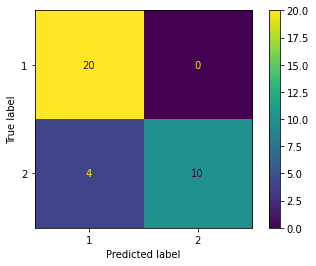

Courbes ROC


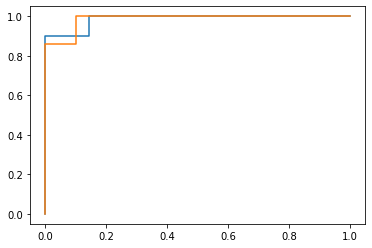

Mean: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.88      0.90      0.89        40
           2       0.85      0.82      0.84        28

    accuracy                           0.87        68
   macro avg       0.86      0.86      0.86        68
weighted avg       0.87      0.87      0.87        68

Matrice de confusion: 


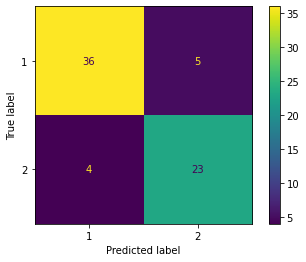

Courbes ROC


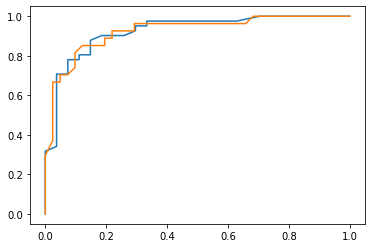

Median: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.78      0.86      0.82        37
           2       0.81      0.71      0.76        31

    accuracy                           0.79        68
   macro avg       0.80      0.79      0.79        68
weighted avg       0.80      0.79      0.79        68

Matrice de confusion: 


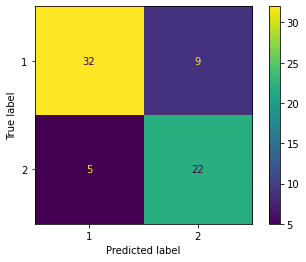

Courbes ROC


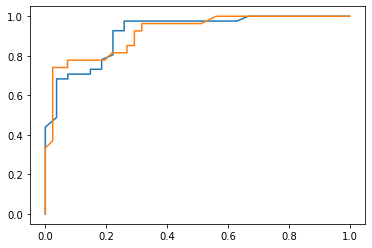

Neighbors: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.88      0.88      0.88        41
           2       0.81      0.81      0.81        27

    accuracy                           0.85        68
   macro avg       0.85      0.85      0.85        68
weighted avg       0.85      0.85      0.85        68

Matrice de confusion: 


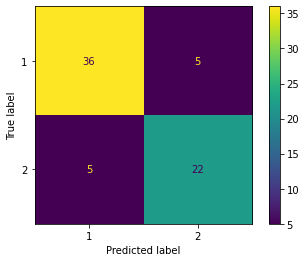

Courbes ROC


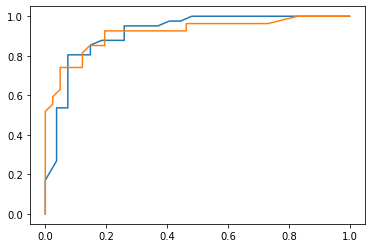

Linear Regression: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.93      0.84      0.88        45
           2       0.74      0.87      0.80        23

    accuracy                           0.85        68
   macro avg       0.83      0.86      0.84        68
weighted avg       0.86      0.85      0.86        68

Matrice de confusion: 


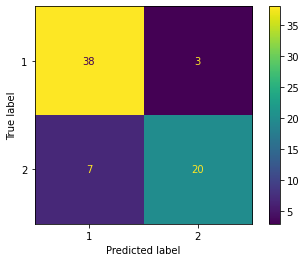

Courbes ROC


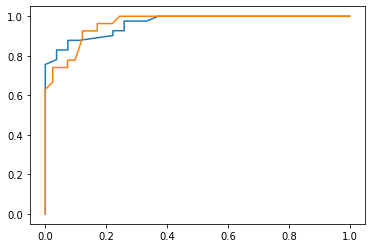

Mode: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.83      0.89      0.86        38
           2       0.85      0.77      0.81        30

    accuracy                           0.84        68
   macro avg       0.84      0.83      0.83        68
weighted avg       0.84      0.84      0.84        68

Matrice de confusion: 


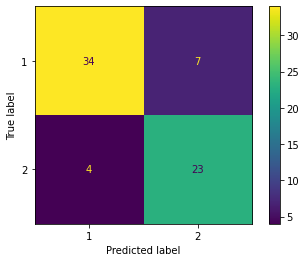

Courbes ROC


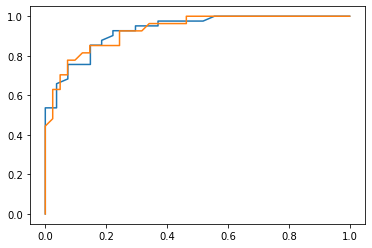

In [91]:
from sklearn.ensemble import RandomForestClassifier

random_forest = MyAlgorithm(RandomForestClassifier(random_state=seed), train_data, test_data)
random_forest.build_algorithm()
random_forest_accuracies = random_forest.get_accuracies()

In [92]:
new_all_accuracies = []

new_all_accuracies.append(nb_accuracies)
new_all_accuracies.append(lg_accuracies)
new_all_accuracies.append(decision_tree_accuracies)
new_all_accuracies.append(knn_accuracies)
new_all_accuracies.append(gbt_accuracies)
new_all_accuracies.append(ada_boost_accuracies)
new_all_accuracies.append(random_forest_accuracies)

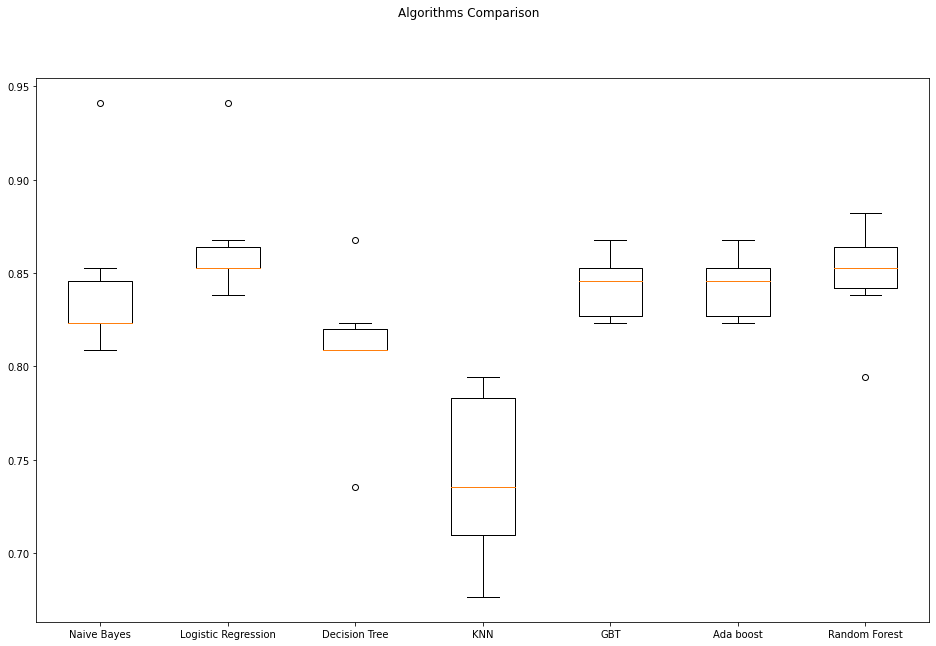

In [93]:
names = ["Naive Bayes", "Logistic Regression", "Decision Tree", "KNN", "GBT", "Ada boost", "Random Forest"]
fig = plt.figure(figsize=(16,10))
fig.suptitle('Algorithms Comparison')
ax = fig.add_subplot(111)
plt.boxplot(new_all_accuracies)
ax.set_xticklabels(names)
plt.show()

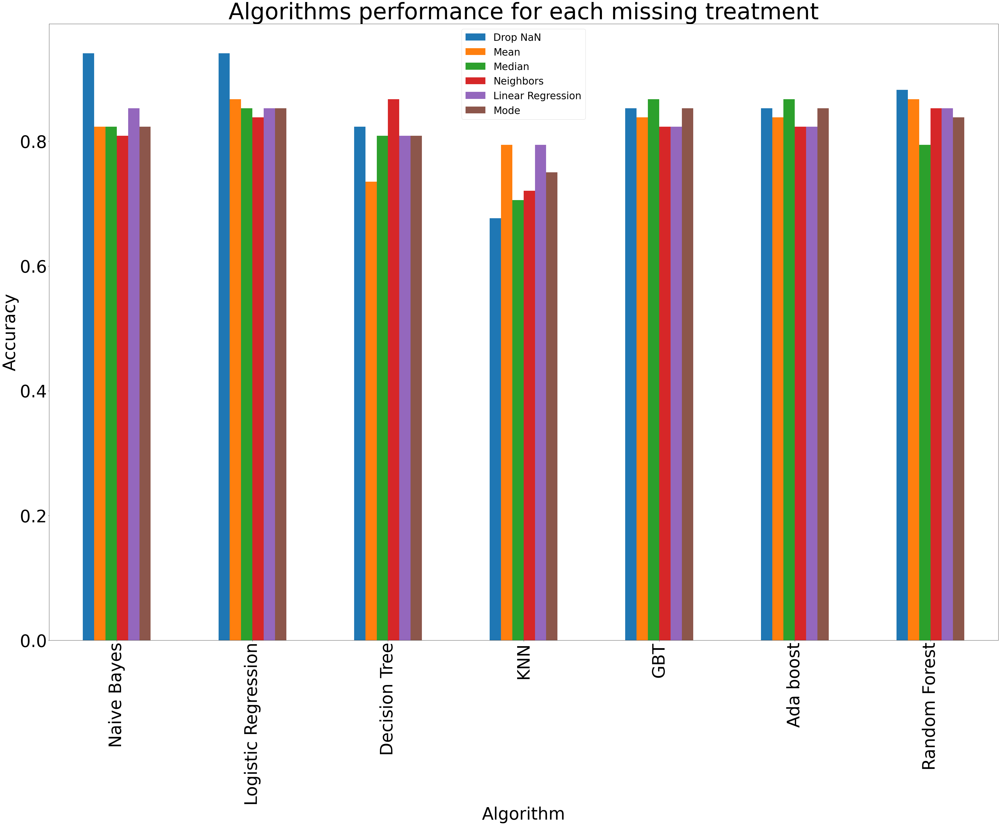

In [94]:
drop_nan_list = []
mean_list = []
median_list = []
neighbors_list = []
linear_reg_list = [] 
mode_list = []

for data in new_all_accuracies:
    drop_nan_list.append(data[0])
    mean_list.append(data[1])
    median_list.append(data[2])
    neighbors_list.append(data[3])
    linear_reg_list.append(data[4])
    mode_list.append(data[5])
    
plotdata = pd.DataFrame({
    "Drop NaN": drop_nan_list,
    "Mean": mean_list,
    "Median": median_list,
    "Neighbors": neighbors_list,
    "Linear Regression": linear_reg_list,
    "Mode": mode_list
    }, 
    index=["Naive Bayes", "Logistic Regression", "Decision Tree", "KNN", "GBT", "Ada boost", "Random Forest"]
)
my_plot = plotdata.plot(kind="bar", figsize=(60,40), fontsize=60)
plt.title("Algorithms performance for each missing treatment", fontsize=80)
plt.xlabel("Algorithm", fontsize=60)
plt.ylabel("Accuracy", fontsize=60)
my_plot.legend(fontsize=35)

In [95]:
plotdata

,Drop NaN,Mean,Median,Neighbors,Linear Regression,Mode
Naive Bayes,0.941176,0.823529,0.823529,0.808824,0.852941,0.823529
Logistic Regression,0.941176,0.867647,0.852941,0.838235,0.852941,0.852941
Decision Tree,0.823529,0.735294,0.808824,0.867647,0.808824,0.808824
KNN,0.676471,0.794118,0.705882,0.720588,0.794118,0.750000
GBT,0.852941,0.838235,0.867647,0.823529,0.823529,0.852941
Ada boost,0.852941,0.838235,0.867647,0.823529,0.823529,0.852941
Random Forest,0.882353,0.867647,0.794118,0.852941,0.852941,0.838235


## 9) et les gagnants sont … 

Je peux voir que les résultats pour GBT et Ada Boost se sont améliorés (algorithmes ensemblistes) puisque j'ai effectué l'extraction de features importantes sur mon algorithme de Random Forest qui est aussi un algorithme ensembliste. Pour mon Random Forest, mes résultats n'ont pas vraiment changé. On observe aussi, une amélioration des résultats pour ma régression logistique puisqu'il y a probablement une dépendance entre les features choisies. Mon algorithme d'arbre de décision s'est aussi amélioré. Aussi, j'aperçois une amélioration dans mon algorithme de Naive Bayes et KNN. Je peux conclure, que de façon générale, mes étapes de sélection des features principales ont bien fonctionné puisque les impacts sont majoritairement positifs sur la performance des mes algorithmes. Ce n'est pas le cas pour mon étude de classification sur le outcome. Cela pourrait s'expliquer par le fait que l'outcome n'est pas une donnée binaire ce qui rend la tâche plus complexe, impactant ainsi la performance de ces algorithmes. Dans ce cas, le grand gagnant serait l'algorithme de Random Forest.

## 10) À vous le mot de la fin 

De manière générale, j'ai pu voir que les algorithmes utilisés performent mieux quand la variable target est binaire. En effet, j'obtiens de meilleurs résultats et la sélection des features importantes a provoqué des améliorations dans presque tous les algorithmes contrairement au problème de classification sur outcome où on a pu voir des détériorations.